# **Automatic Number Plate Recognition under Foggy Conditions**

**Problem description**

Domain of interest: Security / Transport

Automatic Number Plate Recognition (ANPR) identifies vehicle number plates using images
or video. This technology is used by authorities to find stolen cars or bikes, monitor
suspicious vehicles, and spot traffic violations. ANPR is also used by the government or
businesses to automate parking facilities and tolls, which enhances efficiency and reduces
congestion.

A limitation of ANPR is due to the environmental factor of poor weather conditions. Reduced
visibility makes it hard to detect number plates and recognise the characters on them. One
type of condition that greatly reduces visibility is fog, which is significantly relevant in the
UK. It is difficult for human operators to read the plates manually in these conditions;
enhancing the images is time-consuming, and human judgment may be inconsistent. This
means there is a need for artificial intelligence (AI), particularly computer vision techniques,
to challenge this problem.

There is active research in this area. Varma P. et al. (2020) used OpenCV and machine
learning techniques on Indian vehicle number plates under different challenging conditions,
such as varied light intensity, blurriness, angled positions, and worn-out number plates.
Tote et al. (2023) achieved 85% accuracy using TensorFlow in detecting Indian license
plates with different light intensities and varying distances and angles. Our group is
motivated to work on this project to build on existing efforts by developing an AI-based
solution to improve ANPR performance in foggy conditions.

**Aims and Objectives**

The aim of this project is to deploy intelligent systems to accurately detect number plates
and recognise its characters under foggy conditions.

The following measurable objectives have been identified:
1. Collect credible datasets from the internet
2. Preprocess data: applying image enhancements
3. Model training: plate detection, character segmentation, character recognition
4. Model selection: choose a suitable model for the task
5. Evaluation: make predictions to be compared to validation set

In this notebook, each section attempts an independent approach for plate detection, character segmentation, character recognition. Section 1 explores a little about the dataset, and more in Section 2. Plate detection is covered in Section 2. Character Segmentation is covered in Section 3. Character Recognition is presented in Section 4.

File downloads are automated for this notebook so there is no need to manually import (drag and drop) files. The required files are automatically downloaded on the notebook from Rome Delmo's Google Drive. This project assumes this notebook is ran on Google Colab.

---

# **1.Dataset**

**Download**

Download the dataset by running the code below. This imports:

- Ground_Truth_images.zip
- New_Hazy_dataset.zip

In [1]:
!mkdir -p data/ground_truth data/foggy

!gdown https://drive.google.com/uc?id=1ipQyv4PWsqPIvC8LpKsAUAfFvqjvdIy7 -O "Ground_Truth_images.zip"
!unzip -o -q Ground_Truth_images.zip -d data/ground_truth

!gdown https://drive.google.com/uc?id=1vZ6Mr86h8imEws0TLAal3ZTyUj0-zq98 -O "New_Hazy_dataset.zip"
!unzip -o -q New_Hazy_dataset.zip -d data/foggy

Downloading...
From (original): https://drive.google.com/uc?id=1ipQyv4PWsqPIvC8LpKsAUAfFvqjvdIy7
From (redirected): https://drive.google.com/uc?id=1ipQyv4PWsqPIvC8LpKsAUAfFvqjvdIy7&confirm=t&uuid=85ddc069-df9a-4ca5-b464-32a9ec302b4c
To: /content/Ground_Truth_images.zip
100% 2.47G/2.47G [00:32<00:00, 77.1MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1vZ6Mr86h8imEws0TLAal3ZTyUj0-zq98
From (redirected): https://drive.google.com/uc?id=1vZ6Mr86h8imEws0TLAal3ZTyUj0-zq98&confirm=t&uuid=4f68c3e2-5ac5-4811-99cf-5c6f4b7f4b5c
To: /content/New_Hazy_dataset.zip
100% 124M/124M [00:01<00:00, 64.2MB/s]


**Balanced Dataset**

There are 1001 clear and 1001 foggy images.

In [2]:
import os

clear_path = "data/ground_truth/Ground Truth images"
foggy_path = "data/foggy/New Hazy dataset"

for name, path in [("GROUND TRUTH", clear_path), ("FOGGY", foggy_path)]:
    files = os.listdir(path)
    images = [f for f in files if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    exts = {os.path.splitext(f)[1].lower() for f in images}

    print("{}:".format(name))
    print("Number of files: {}".format(len(files)))
    print("Number of images: {}".format(len(images)))
    print("Types: {}".format(exts))

GROUND TRUTH:
Number of files: 1001
Number of images: 1001
Types: {'.png', '.jpg'}
FOGGY:
Number of files: 1001
Number of images: 1001
Types: {'.png'}


**Visualising the Dataset**

Relevant libraries are imported. This include OpenCV `cv2` for image processing, matplotlib `plt` for plotting, and numpy `np` for mathematical operations. The first three clear and foggy images are loaded. Lines 13 to 15 converts images from OpenCV's default BGR format (Blue, Green, Red) to RGB (Red, Green, Blue). To user-defined functions have been introduced:

- `show_img(im, ax, filename)`: displays one image with its filename and dimensions

- `show_imgs(clear_imgs, foggy_imgs, filenames, figsize=(20, 8))`: displays the clear and foggy images next to each other for ease of comparison.

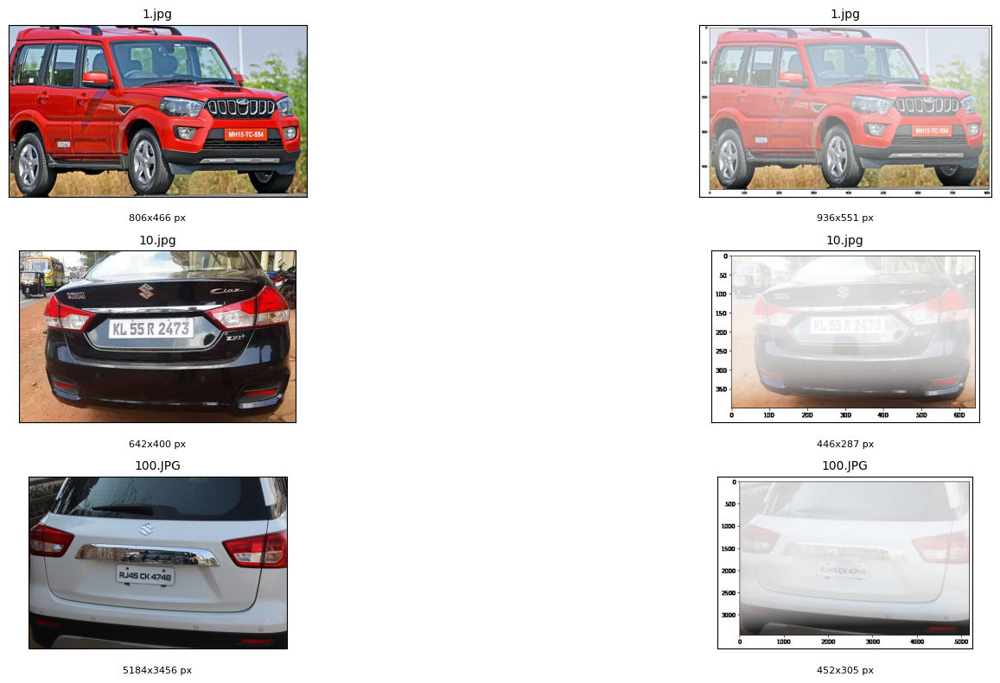

In [3]:
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np

# Getting the first three images
clear_images = sorted([f for f in os.listdir(clear_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])[:3]  # First 3 images
foggy_images = sorted([f for f in os.listdir(foggy_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])[:3]  # First 3 images

# Ensure that number of images matches between clear and foggy datasets
assert len(clear_images) == len(foggy_images)

# Converting images from BGR to RGB
clear_imgs = [cv2.cvtColor(cv2.imread(os.path.join(clear_path, img)), cv2.COLOR_BGR2RGB) for img in clear_images]
foggy_imgs = [cv2.cvtColor(cv2.imread(os.path.join(foggy_path, img)), cv2.COLOR_BGR2RGB) for img in foggy_images]

# Function for displaying images with filename and pixel size
def show_img(im, ax, filename):
    ax.imshow(im)
    ax.set_title(filename, fontsize=10)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    h, w = im.shape[:2]
    ax.text(0.5, -0.1, str(w) + "x" + str(h) + " px", ha="center", va="top", transform=ax.transAxes, fontsize=8)
    return ax

# Function for displaying pairs of clear and foggy images side by side
def show_imgs(clear_imgs, foggy_imgs, filenames, figsize=(20, 8)):
    fig, axes = plt.subplots(len(clear_imgs), 2, figsize=figsize)
    for i in range(len(clear_imgs)):
        show_img(clear_imgs[i], axes[i, 0], filenames[i])
        show_img(foggy_imgs[i], axes[i, 1], filenames[i])
    plt.tight_layout()
    plt.show()

show_imgs(clear_imgs, foggy_imgs, clear_images, figsize=(20, 8))

---
# **2.Plate Detection**

This section attempts to investigate the use of Computer Vision techniques to locate the number plate in the image, number plates are the boxes in front or back of a vehicle that enclose the unique identifier of a vehicle.

## **2.1 Haar Cascade Classifier**

The Haar Cascade classifier is machine learning object detection method. It uses Haar features: Edge, Line, and Four-rectangle features. These features are identified from contrast changes between adjacent image rectangles. (OpenCV 2025)


AdaBoost (Adaptive Boosting) is an ensemble learning algorithm. It is used here to choose the most important Haar features and create a strong classifier by training weaker ones. It uses images that weaker classifiers get wrong first, this allows it to focus on the more challenging features. The final classifier combines the best of these weaker classifiers which makes plate detection more effective.

We will investigate first its performance using a pre-trained Haar Cascade for Indian license plate detection. The `indian_license_plate.xml` stores the pre-trained Haar Cascade classifier to detect Indian license plates. This file is downloaded directly from Google Drive, so there is no need for any manual downloads. (Vajpayee 2020)


In [4]:
import random

In [5]:
# Creating directory for XML
if not os.path.exists('pretrained_models'):
    os.makedirs('pretrained_models')

# Downloading pretrained model from Google Drive
file_id = '1Hyrp9Cfvmyy3Ktl_ldHGLD8PF5dLw_iI'
output_path = 'pretrained_models/indian_license_plate.xml'
!gdown --id {file_id} -O {output_path}

pretrained_haar = output_path
haar_classifier = cv2.CascadeClassifier(pretrained_haar)

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1Hyrp9Cfvmyy3Ktl_ldHGLD8PF5dLw_iI
From (redirected): https://drive.google.com/uc?id=1Hyrp9Cfvmyy3Ktl_ldHGLD8PF5dLw_iI&confirm=t&uuid=18130083-b376-40d2-9944-8217d47c380d
To: /content/pretrained_models/indian_license_plate.xml
100% 27.3k/27.3k [00:00<00:00, 73.3MB/s]


The user-defined function `detect_plate` inputs a location of an image and extracts the license plate of that one image using the Haar Cascade classifier. The output should be the original image with a box on the identified number plate and the number plate region. This closely follows the methodology of the owner of the pretrained model. (Vajpayee 2021)

The user-defined function `extract_plates` uses `detect_plate` for each image in the dataset, saves that with the detected plate highlighted, and also saves the number plate region as a separate image. The function also counts the number of successfully detected plates with the total number of images processed.

In [6]:
# Detecting number plate in one image
def detect_plate(image_location):
    try:
        img = cv2.imread(image_location)
        if img is None:
            print(f"Cannot read image from '{image_location}'.")
            return None, None

        plate_img = img.copy()
        region = img.copy()
        # finding coordinates of number plate
        plate_coordinates = haar_classifier.detectMultiScale(plate_img, scaleFactor=1.2, minNeighbors=7)
        detected_plate = None

        for (x, y, w, h) in plate_coordinates:
            region_ = region[y:y+h, x:x+w, :]
            plate = region[y:y+h, x:x+w, :]
            cv2.rectangle(plate_img, (x+2, y), (x+w-3, y+h-5), (0, 0, 255), 3)
            detected_plate = plate
            break

        return plate_img, detected_plate

    except Exception as e:
        print(f"Cannot process image '{image_location}', {e}")
        return None, None

# Locating and extracting number plates, then save results of original image with box AND exact regions
def extract_plates(dataset_path, output_path, dataset_name, num_images=100):
    os.makedirs(output_path, exist_ok=True)
    all_img_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.jpeg', '.png','.JPG'))]
    total_possible_images = len(all_img_files)
    imgfile = random.sample(all_img_files, num_images)
    total_image_count = len(imgfile)
    detected_count = 0

    for filename in imgfile:
        image_location = os.path.join(dataset_path, filename)
        plate_img, detected_plate = detect_plate(image_location)

        if plate_img is not None:
            output_filename = os.path.splitext(filename)[0] + f'_{dataset_name}_detected.jpg'
            output_filepath = os.path.join(output_path, output_filename)
            cv2.imwrite(output_filepath, plate_img)

            if detected_plate is not None and not detected_plate.size == 0:
                extracted_filename = os.path.splitext(filename)[0] + f'_{dataset_name}_plate.jpg'
                extracted_filepath = os.path.join(output_path, extracted_filename)
                cv2.imwrite(extracted_filepath, detected_plate)
                detected_count += 1

    return detected_count, total_image_count

*Clear Images*

Number plates in clear images are detected and extracted. The plate extraction rate for the clear images is the percentage that the classifier has detected a plate out of all images that have been processed.

In [7]:
# Dataset location
clear_path = "data/ground_truth/Ground Truth images"
foggy_path = "data/foggy/New Hazy dataset"

# Output
output_clear_path = 'detected_plates/clear_sample'
output_foggy_path = 'detected_plates/foggy_sample'

# Clear dataset extraction
num_clear_samples = 100
detected_clear_count, total_clear_images = extract_plates(clear_path, output_clear_path, "clear", num_clear_samples)
print("Clear Dataset")
print("Total images processed: ", total_clear_images)
print("Number of plates detected: ", detected_clear_count)
if total_clear_images > 0:
    extraction_rate_clear = (detected_clear_count / total_clear_images) * 100
    print("Plate Extraction Rate: ", extraction_rate_clear)
else:
    print("No images found in the clear dataset directory.")

Clear Dataset
Total images processed:  100
Number of plates detected:  88
Plate Extraction Rate:  88.0


*Foggy Images*

In [8]:
# Foggy dataset extraction
num_foggy_samples = 100
detected_foggy_count, total_foggy_images = extract_plates(foggy_path, output_foggy_path, "foggy", num_foggy_samples)
print("Foggy Dataset")
print("Total images processed: ", total_foggy_images)
print("Number of plates detected: ", detected_foggy_count)
if total_foggy_images > 0:
    extraction_rate_foggy = (detected_foggy_count / total_foggy_images) * 100
    print("Plate Extraction Rate (Foggy): ", extraction_rate_foggy)
else:
    print("No images found in the foggy dataset directory.")

Foggy Dataset
Total images processed:  100
Number of plates detected:  67
Plate Extraction Rate (Foggy):  67.0


*Evaluation*

From the experiment above, it can be seen that Plate Extraction Rate is significantly reduced for foggy images than clear images. This makes sense because fog obscures the edges and other features, making it more challenging for the classifier.

In terms of time, processing 100 clear images reached about 5 minutes. Approximately extrapolating for the whole dataset, this processing time could take significantly longer; hence, for this type of task it is computationally expensive.

Looking closer at the results, it appears that there are plenty of false positives. The classifier has succesfully peformed an identification but not identified the number plate correctly. It has identified other objects in the image that are not number plates.

In terms of those plates identified succesfully, True Positives, the box fitted well around the region required region.

## **2.2 Transfer Learning with ResNet50**

This section aims to develop a solution for detecting number plates under challenging foggy conditions. To achieve this, a comprehensive approach was taken. The key objectives of this section are:

1. Gather and preprocess clear and foggy image datasets.

2. Train a ResNet50 model using transfer learning.

3. Refine model performance through freezing and hyperparameter- tuning.

4. Evaluate model accuracy using average IoU on a untouched test set.

**Libraries**

Common libraries like numpy were used for mathematical operations, whereas matplotlib were used to visualise the images, plot loss curves, and display the bounding boxes around the number plate. Scikit-learn was used only for splitting the image dataset to training, validation, and test sets. OpenCV (cv2) and Python Imaging Library (PIL) were used for reading the images and perform basic preprocessing. The object detection model was implemented using PyTorch. `tqdm` provided progress bars to monitor the duration of the code.

In [9]:
import warnings; warnings.filterwarnings("ignore") # disable all warnings

In [10]:
# For Computation and Visualization
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.patheffects as patheffects

# for image Processing
import cv2
import PIL
from PIL import Image, ImageEnhance, ImageFilter

# For handling data
from sklearn.model_selection import train_test_split
import torch
import torch as tc
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# for deep learning
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torchvision.models as models
import torchvision.transforms.functional as F_vision
from torch.utils.data import random_split, ConcatDataset

# other useful libraries
import os
import time
import random
import json
import zipfile
import gdown
from tqdm.notebook import tqdm, trange
from itertools import chain

### **2.2.1 Data Acquisition and Preparation**

Clear and Foggy images are stored in the folders `clear_images` and `foggy_images` respectively. Their repsective annotations, `annot_clear.json` and `annot_foggy.json` are loaded from a Google Drive link.

In [11]:
# Extracting clear and foggy images from downloaded zip
with zipfile.ZipFile("Ground_Truth_images.zip", 'r') as zip_ref:
    zip_ref.extractall("clear_images")

with zipfile.ZipFile("New_Hazy_dataset.zip", 'r') as zip_ref:
    zip_ref.extractall("foggy_images")

# Downloading clear and foggy annotation files from Google Drive
url = 'https://drive.google.com/uc?id=1ePZoewVvaHfk5lUOMv1QqK84zWAawZMc'
output = 'annot_clear.json'
gdown.download(url, output, quiet=False)
annotation_clear = output

url = 'https://drive.google.com/uc?id=1ZvP-9C6PAwXlcB8tQK4G7sp4mvjtuvjQ'
output = 'annot_foggy.json'
gdown.download(url, output, quiet=False)
annotation_foggy = output

Downloading...
From: https://drive.google.com/uc?id=1ePZoewVvaHfk5lUOMv1QqK84zWAawZMc
To: /content/annot_clear.json
100%|██████████| 286k/286k [00:00<00:00, 124MB/s]
Downloading...
From: https://drive.google.com/uc?id=1ZvP-9C6PAwXlcB8tQK4G7sp4mvjtuvjQ
To: /content/annot_foggy.json
100%|██████████| 279k/279k [00:00<00:00, 108MB/s]


**Data Processing**

ImageNet normalisation is used to normalise the new dataset in this project. Let us define the the ImageNet statistics where `[0.485, 0.456, 0.406]` and `[0.229, 0.224, 0.225]` are the mean and standard deviation of red, green, and blue color channels respectively.

In [12]:
# ImageNet statistics for normalisation
imagenet_stats = ([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])

In [13]:
# This class will convert input image to PyTorch tensor
class ToTensor(transforms.ToTensor):
    def __call__(self, inp):
        return super().__call__(inp[0]), inp[1]

# This class will normalise pixel values of image tensors using imagenet_stats
class Normalize(transforms.Normalize):
    def __call__(self, inp):
        return super().__call__(inp[0]), inp[1]

In [14]:
# Mappings for integer to class (i2c) and class to integer (c2i)
i2c = {0: 'number_plate'}
c2i={'number_plate': 0}

The `NumberPlateDataset()` class is a custom PyTorch dataset. `__init__` initialises the dataset by storing clear and foggy images, their corresponding annotation, data type (whether clear or foggy), and transformations. `_load_annotations` extracts the bounding box and label from the JSON files; `_find_missing_annotations` double-checks if images have no annotations. `__len__` returns the size of the dataset. `__getitem__` returns one image and its corresponding normalised bounding box where applying transformations beforehand can be done too.

In [15]:
class NumberPlateDataset(Dataset):
    def __init__(self, image_dir, annotation_file, c2i=c2i, transforms=ToTensor(), image_names=None, data_type="clear"):
        super().__init__()
        self.image_dir = image_dir
        self.annotation_file = annotation_file
        self.annotations = self._load_annotations()
        self.image_names = image_names if image_names else list(self.annotations.keys())
        self.c2i = c2i
        self.transforms = transforms
        self.data_type = data_type

    def _load_annotations(self):
        with open(self.annotation_file, 'r') as f:
            annotations = json.load(f)
        image_annotations = {}
        for key, value in annotations['_via_img_metadata'].items():
            filename = value['filename']
            regions = value['regions']
            boxes = []
            for region in regions:
                if region['region_attributes']['label'].get('number_plate'):
                    shape_attributes = region['shape_attributes']
                    x = shape_attributes['x']
                    y = shape_attributes['y']
                    width = shape_attributes['width']
                    height = shape_attributes['height']
                    boxes.append([x, y, width, height])
            if boxes:
                image_annotations[filename] = {
                    'boxes': boxes,
                    'labels': ['number_plate'] * len(boxes)
                }
        return image_annotations

    def _find_missing_annotations(self):
        subdirectory = 'Ground Truth images' if self.data_type == "clear" else 'New Hazy dataset'
        all_image_files = [f for f in os.listdir(os.path.join(self.image_dir, subdirectory))
                           if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        annotated_images = list(self.annotations.keys())
        missing_annotations = list(set(all_image_files) - set(annotated_images))
        return missing_annotations

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        image_name = self.image_names[idx]
        subdirectory = 'Ground Truth images' if self.data_type == "clear" else 'New Hazy dataset'
        img_path = os.path.join(self.image_dir, subdirectory, image_name)
        image_pil = Image.open(img_path).convert("RGB")
        width, height = image_pil.size
        annotation = self.annotations.get(image_name)

        if annotation is None:
            print(f"Warning: Annotation not found for image: {image_name}")
            return None

        boxes = annotation['boxes']
        labels = annotation['labels']
        selected_box = boxes[0]
        box_np = np.array(selected_box, dtype=np.float32)
        normalized_box = box_np / np.array([width, height, width, height])

        image_pil, normalized_box = self.transforms((image_pil, normalized_box))

        return image_pil, (tc.Tensor([self.c2i[labels[0]]]).long(), tc.Tensor(normalized_box).float())

**Data Visualisation**

The following user-defined function is borrowed from the Computer Vision Lectures. `show_img` presents one image with title and size of figure; whereas, `show_imgs` presents multiple images in a grid that uses `show_img` for each image. `draw_rect` draws a rectangle box to an image which is used in `show_img_bbox` to show the image with its corresponding bounding box.

In [16]:
def show_img(im, ax=None, figsize=(8,8), title=None):
    if not ax: _,ax = plt.subplots(1,1,figsize=figsize)
    if len(im.shape)==2: im = np.tile(im[:,:,None], 3)
    ax.imshow(im);
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    if title: ax.set_title(title)
    return ax

def show_imgs(ims, rows=1, figsize=(16,8), title=[None]):
    title = title*len(ims) if len(title) == 1 else title
    _,ax = plt.subplots(rows, len(ims)//rows, figsize=figsize)
    [show_img(im,ax_,title=tit) for im,ax_,tit in zip(ims,ax.flatten(),title)]
    return ax

def draw_rect(ax, xy, w, h):
    patch = ax.add_patch(patches.Rectangle(xy, w, h, fill=False, edgecolor='yellow', lw=2))
    patch.set_path_effects([patheffects.Stroke(linewidth=4, foreground='black'), patheffects.Normal()])

def show_img_bbox(x,y,ax=None):
    h,w = x.shape[1:]
    ax = show_img(x.numpy().transpose(1,2,0), ax=ax, title=i2c[y[0].item()])
    draw_rect(ax, [y[1][0]*w, y[1][1]*h], y[1][2]*w, y[1][3]*h)

A sanity check is performed to ensure that each image has a corresponding label and bounding box.

In [17]:
# Clear dataset have no missing annotations
clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', data_type="clear")
missing_annotations = clear_dataset._find_missing_annotations()
if missing_annotations:
    print("Annotations missing for clear images:")
    for image_name in missing_annotations:
        print(image_name)
else:
    print("No missing annotations in the clear dataset.")

# Foggy dataset have no missing annotations
foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', data_type="foggy")
missing_annotations = foggy_dataset._find_missing_annotations()
if missing_annotations:
    print("Annotations missing for foggy images:")
    for image_name in missing_annotations:
        print(image_name)
else:
    print("No missing annotations in the foggy dataset.")

No missing annotations in the clear dataset.
No missing annotations in the foggy dataset.


Below loads a dataset of clear and foggy images along with their annotations. A specific image is chosen and its bounding box is extracted, a display of the image with the bounding box are shown.

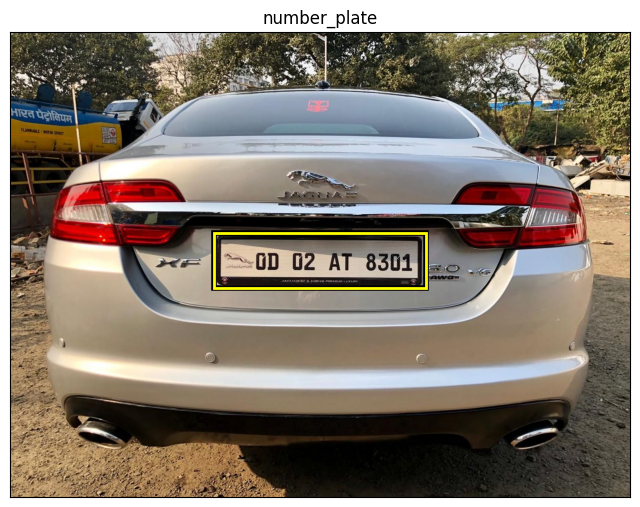

In [18]:
# Dataset instance for clear dataset
clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', c2i=c2i)

# Extracting a random image and target
x, y = clear_dataset[5]

# Displaying image and its bounding box
show_img_bbox(x,y)
plt.show()

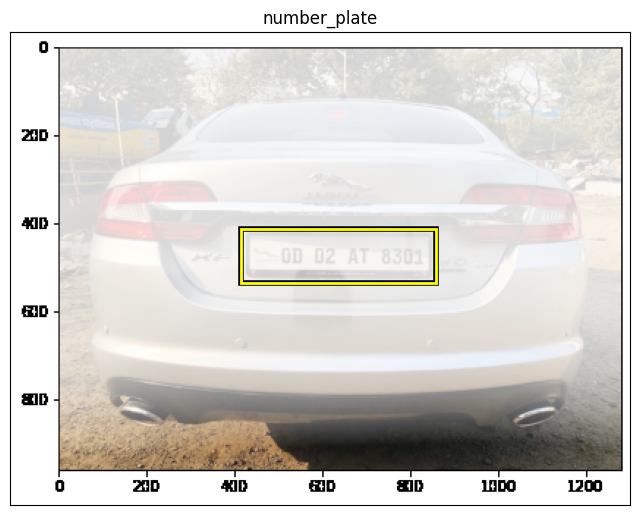

In [19]:
foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', c2i=c2i, data_type="foggy")
x, y = foggy_dataset[5]
show_img_bbox(x,y)
plt.show()


The bounding box have been manually drawn for 1001 clear images and 1001 foggy images. The recommended VGG Image editor (Dutta et al. 2025) was used to annotate the images and obtain the JSON files `annot_clear.json` and `annot_foggy.json`.

**Data Augmentation**

This code snippet was borrowed from the Computer Vision lectures. Data augmentation is a technique used in this project to diversify the training dataset via applying random transformations to them for improving model training. `FlipHoriz` randomly flips some images horizontally to make varied orientations. `ResizeCrop` resizes and crops some images to make varied image scale; it is ensured that the bounding box remains visible in the transformed image. With these transformations, the bounding boxes are adjusted accordingly.

In [20]:
# This reverses ImageNet normalisation to output display image
def denorm(x, stats=imagenet_stats):
    return x * tc.Tensor(stats[1])[:,None,None] + tc.Tensor(stats[0])[:,None,None]

torch.Size([3, 1024, 768])

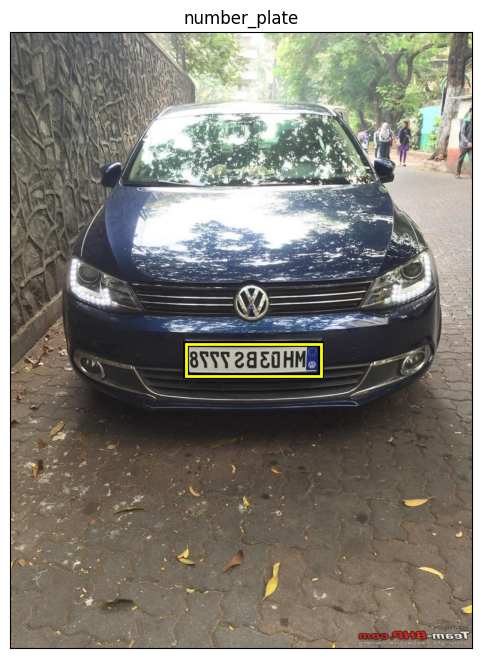

In [21]:
class FlipHoriz(object):
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, inp):
        im, bbox = inp
        if np.random.rand() < self.p:
            im = im.transpose(PIL.Image.FLIP_LEFT_RIGHT)
            bbox[0] = max(0, 1 - bbox[0] - bbox[2])
        return im, bbox

# Defining transformations (an example)
tfms = transforms.Compose([
    FlipHoriz(),
    ToTensor(),
    Normalize(mean=imagenet_stats[0], std=imagenet_stats[1])])

# Transformed clear image example
tfms_image = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', c2i=c2i, transforms=tfms)
x,y = tfms_image[17]
show_img_bbox(denorm(x),y)
x.size()

torch.Size([3, 256, 256])

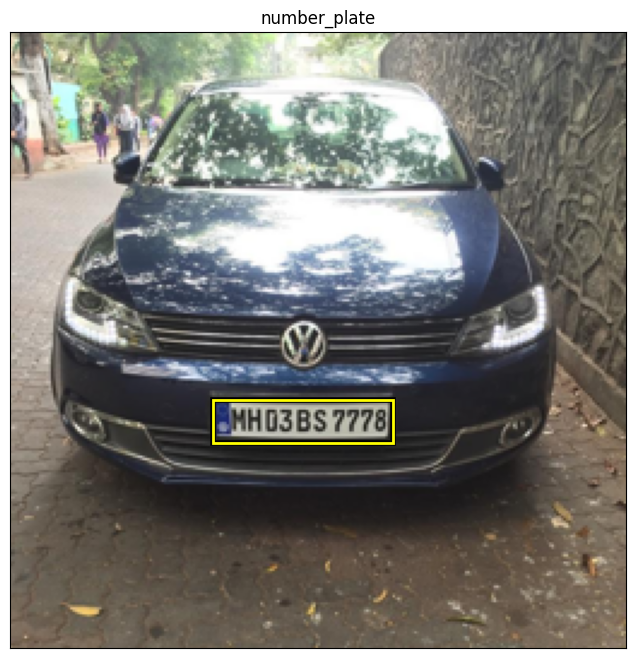

In [22]:
class ResizeCrop(object):
    def __init__(self, sz=(256,256), valid=False):
        self.sz, self.valid = sz, valid  # sz = (w,h)

    def __call__(self, inp):
        im, bbox = inp
        margin = 8
        w,h = im.size
        if w<h: new_w, new_h = self.sz[0], self.sz[0]*h // w
        else:   new_w, new_h = self.sz[1]*w // h, self.sz[1]
        im = im.resize((new_w,new_h))

        if new_h != self.sz[0] or new_w != self.sz[1]:
            bbox = bbox * np.array([new_w,new_h,new_w,new_h])
            if self.valid:
                left, top = min(new_w-self.sz[0], bbox[0]), min(new_h-self.sz[1], bbox[1])
            elif new_w==self.sz[0]:
                left, top = 0, np.random.randint(max(0,bbox[1]+margin-self.sz[1]), min(bbox[1]+bbox[3]-margin, new_h-self.sz[1]))
            else:
                left, top = np.random.randint(max(0,bbox[0]+margin-self.sz[0]), min(bbox[0]+bbox[2]-margin, new_w-self.sz[0])), 0
            im = im.crop((left, top, left+self.sz[0], top+self.sz[1]))

            bbox[:2] -= [left, top]
            if bbox[0] < 0:
                bbox[2] = bbox[2] + bbox[0]
                bbox[0] = 0
            if bbox[1] < 0:
                bbox[3] = bbox[3] + bbox[1]
                bbox[1] = 0

            bbox[2] = min(bbox[2], self.sz[0]-bbox[0])
            bbox[3] = min(bbox[3], self.sz[1]-bbox[1])

            bbox /= [*self.sz, *self.sz]

        return im, bbox

tfms = transforms.Compose([
    ResizeCrop(sz=(256, 256)),
    ToTensor(),
    Normalize(mean=imagenet_stats[0], std=imagenet_stats[1])])

tfms_image = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', c2i=c2i, transforms=tfms)
x,y = tfms_image[17]
show_img_bbox(denorm(x),y)
x.size()

torch.Size([3, 1024, 768])

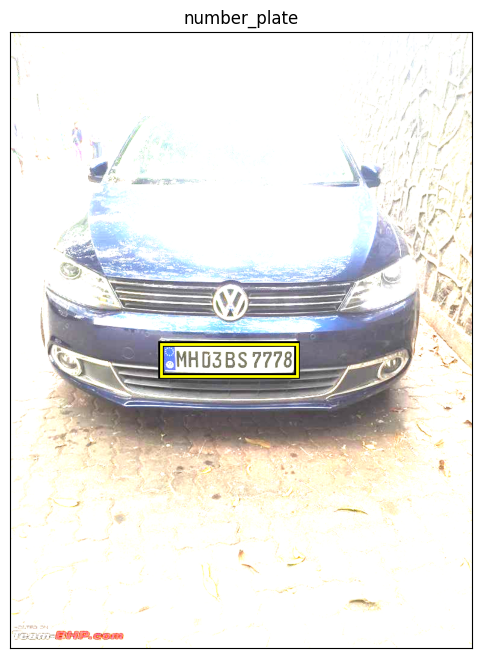

In [23]:
# Adjusting brightness of the image, values 0.5 to 6 where eye can clearly identify the number plate sides
class Brightness(object):
    def __init__(self, factor_range=(0.5, 6)):
        self.factor_range = factor_range

    def __call__(self, inp):
        im, bbox = inp
        factor = np.random.uniform(self.factor_range[0], self.factor_range[1])
        enhancer = ImageEnhance.Brightness(im)
        im = enhancer.enhance(factor)
        return im, bbox

tfms = transforms.Compose([
    Brightness(),
    ToTensor(),
    Normalize(mean=imagenet_stats[0], std=imagenet_stats[1])])

tfms_image = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', c2i=c2i, transforms=tfms)
x,y = tfms_image[17]
show_img_bbox(denorm(x),y)
x.size()

torch.Size([3, 1024, 768])

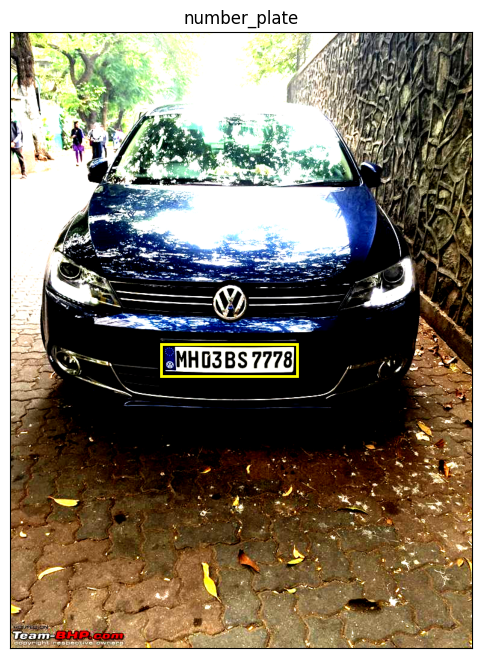

In [24]:
# Adjusting contrast of the image, values 1 to 10 where eye can clearly identify the number plate sides
class Contrast(object):
    def __init__(self, factor_range=(1,10)):
        self.factor_range = factor_range

    def __call__(self, inp):
        im, bbox = inp
        factor = np.random.uniform(self.factor_range[0], self.factor_range[1])
        enhancer = ImageEnhance.Contrast(im)
        im = enhancer.enhance(factor)
        return im, bbox

tfms = transforms.Compose([
    Contrast(),
    ToTensor(),
    Normalize(mean=imagenet_stats[0], std=imagenet_stats[1])])

tfms_image = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', c2i=c2i, transforms=tfms)
x,y = tfms_image[17]
show_img_bbox(denorm(x),y)
x.size()

torch.Size([3, 1024, 768])

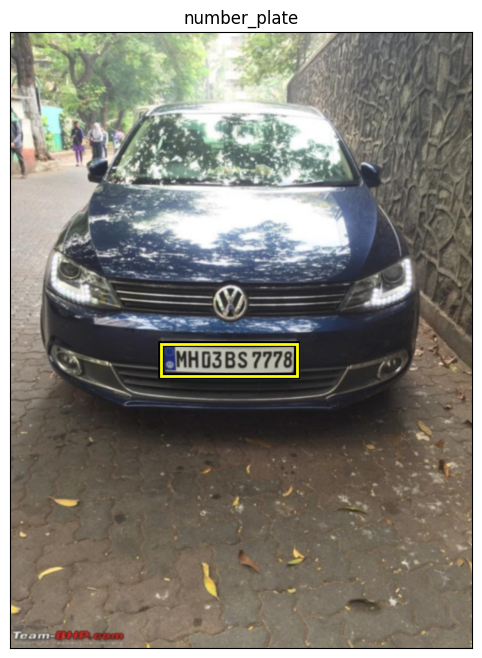

In [25]:
# Adjusting blurring of the image, values above 8 appears to lose distinct number plate sides
class GaussianBlur(object):
    def __init__(self, kernel_size_range=(1, 8)):
        self.kernel_size_range = kernel_size_range

    def __call__(self, inp):
        im, bbox = inp
        kernel_size = random.randrange(self.kernel_size_range[0], self.kernel_size_range[1], 2)  # Ensure odd kernel size
        im = im.filter(ImageFilter.GaussianBlur(radius=kernel_size//2))
        return im, bbox

tfms = transforms.Compose([
    GaussianBlur(),
    ToTensor(),
    Normalize(mean=imagenet_stats[0], std=imagenet_stats[1])])

tfms_image = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', c2i=c2i, transforms=tfms)
x,y = tfms_image[17]
show_img_bbox(denorm(x),y)
x.size()

**Data Splitting**

The clear and foggy datasets are split into 80% training, 10% validation, and 10% test sets using `train_test_split`. The model learns from the training data, tuned by using the validation set, and its final performance evaluated on the unseen test set.

In [26]:
clear_image_dir = 'clear_images/Ground Truth images'
clear_image_files = [f for f in os.listdir(clear_image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Spliting to training and the temporary (validation and test) set
clear_train_files, clear_temp_files = train_test_split(clear_image_files, test_size=0.2, random_state=42)

# Splitting to validation and test sets
clear_valid_files, clear_test_files = train_test_split(clear_temp_files, test_size=0.5, random_state=42)

print(f"Number of training images: {len(clear_train_files)}")
print(f"Number of validation images: {len(clear_valid_files)}")
print(f"Number of test images: {len(clear_test_files)}")

Number of training images: 800
Number of validation images: 100
Number of test images: 101


In [27]:
foggy_image_dir = 'foggy_images/New Hazy dataset'
foggy_image_files = [f for f in os.listdir(foggy_image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Spliting to training and the temporary (validation and test) set
foggy_train_files, foggy_temp_files = train_test_split(foggy_image_files, test_size=0.2, random_state=42)

# Splitting to validation and test sets
foggy_valid_files, foggy_test_files = train_test_split(foggy_temp_files, test_size=0.5, random_state=42)

print(f"Number of foggy training images: {len(foggy_train_files)}")
print(f"Number of foggy validation images: {len(foggy_valid_files)}")
print(f"Number of foggy test images: {len(foggy_test_files)}")

Number of foggy training images: 800
Number of foggy validation images: 100
Number of foggy test images: 101


### **2.2.2 Modelling**

**Model Architecture**

Residual Networks 50 (ResNet50) is a convolutional neural network architecture created by Microsoft Research Asia(Potrimba 2024). This model was trained on ImageNet dataset initially, but it will be used in this project by adapting it for number plate detection. The process starts with an input image processed in an initial convolutional block. This extracts the basic features and reduces the size of the image. The resulting feature maps are passed through the residual blocks; each residual block consists of multiple convolutional layers. The blocks learn unique number plate patterns progressively. Afterwards, average global pooling summarizes these features. Finally, a modified final layer, a bounding box regression head and a classification head, replaced  the original for predicting the location and classification of the number plate within an image. My handrawn sketch of Resnet 50 architecture is presented below.

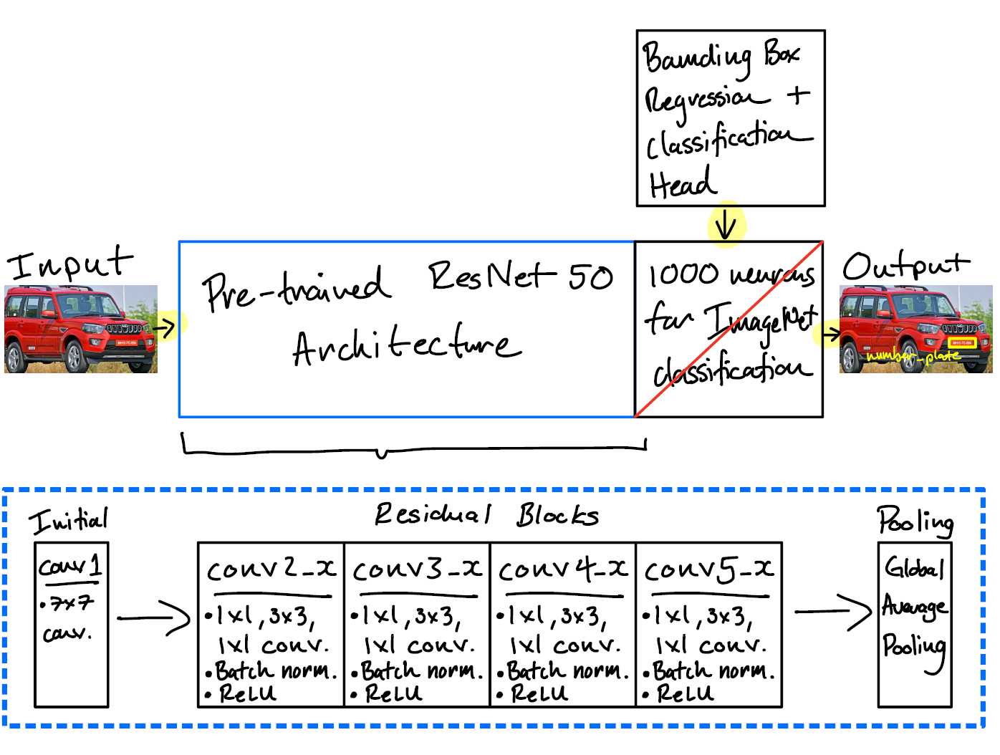

**Figure 1: Handrawn ResNet50 architecture**

In [28]:
# ResNet50 Model in detail
resnet50_model = models.resnet50(pretrained=True)
resnet50_model

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 218MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

*Justification*

ResNet50 was chosen for this task because its deep layers and residual connections enables it to be good at extracting complex features. With foggy images, it is desirable to choose a model that can capture the feintest features as possible. Furthermore, a pre-trained Resnet50 is readily available so transfer learning can be performed. This will allow the project to leverage existing knowledge of general image features which should improve performance.

**Training Process**

These user-defined functions were borrowed from the Computer Vision lectures. Please see their individual comments to understand what they do.

In [29]:
# Train + Evaluate the model for 1 epoch
def one_epoch(net, loss, dl, opt=None, metric=None):
    if opt: net.train()
    else:   net.eval()
    L, M = [], []
    dl_it = iter(dl)
    for xb, yb in tqdm(dl_it, leave=False):
        xb = xb.cuda()
        if not isinstance(yb, list): yb = [yb]
        yb = [yb_.cuda() for yb_ in yb]

        if opt:
            y_ = net(xb)
            l = loss(y_, yb)
            opt.zero_grad()
            l.backward()
            opt.step()
        else:
            with tc.no_grad():
                y_ = net(xb)
                l = loss(y_, yb)
        L.append(l.detach().cpu().numpy())
        if metric: M.append(metric(y_, yb).cpu().numpy())
    return L, M

# Model training and then plots training and validation loss curves
def fit(net, tr_dl, val_dl, loss=nn.CrossEntropyLoss(), epochs=3, lr=3e-3, wd=1e-3, plot=True):
    opt = optim.Adam(net.parameters(), lr=lr, weight_decay=wd)
    Ltr_hist, Lval_hist = [], []
    for epoch in trange(epochs):
        Ltr,  _    = one_epoch(net, loss, tr_dl,  opt)
        Lval, Aval = one_epoch(net, loss, val_dl, None, accuracy)
        Ltr_hist.append(np.mean(Ltr))
        Lval_hist.append(np.mean(Lval))
        print(f'epoch: {epoch}\ttraining loss: {np.mean(Ltr):0.4f}\tvalidation loss: {np.mean(Lval):0.4f}\tvalidation accuracy: {np.mean(Aval):0.2f}')

    if plot:
        _,ax = plt.subplots(1,1,figsize=(16,4))
        ax.plot(1+np.arange(len(Ltr_hist)),Ltr_hist)
        ax.plot(1+np.arange(len(Lval_hist)),Lval_hist)
        ax.grid('on')
        ax.set_xlim(left=1, right=len(Ltr_hist))
        ax.legend(['training loss', 'validation loss']);

    return Ltr_hist, Lval_hist

# Repeated Freezing
def _freeze(md, fr=True):
    ch = list(md.children())
    for c in ch: _freeze(c, fr)
    if not ch and not isinstance(md, tc.nn.modules.batchnorm.BatchNorm2d):  # not freezing the BatchNorm layers!
        for p in md.parameters():
            p.requires_grad = not fr

# Freezing layers up to specified index
def freeze_to(md, ix=-1):
    ch_all = list(md.children())
    for ch in ch_all[:ix]: _freeze(ch, True)

# Unfreezing layers up to specified index.
def unfreeze_to(md, ix=-1):
    ch_all = list(md.children())
    for ch in ch_all[:ix]: _freeze(ch, False)

# Enables parallel processing of a specifeid function
def parallel(func, inp, workers=4):
    pool = ProcessPoolExecutor if _platform.startswith('linux') else ThreadPoolExecutor
    with pool(max_workers=workers) as ex:
        futures = [ex.submit(func,i) for i in inp]
        results = [r for r in tqdm(as_completed(futures), total=len(inp), leave=True)]
    res2ix = {v:k for k,v in enumerate(results)}
    out = [results[res2ix[f]].result() for f in futures]
    return out

Functions obtained from lectures were `accuracy()`, `myloss()`, `get_preds()`, and `show_results()`. The following user-defined functions implemented for this projects are:

- `average_iou(Y_, Y)`: this calculates the average Interesction over Union (IoU) between the predicted bounding boxes (`Y_`) and the ground truth bounding boxes (`Y`).

- `evaluate(model, data_loader)`: evaluates performance of model on a given data loader using `average_iou(Y_, Y)`.

Classification accuracy is an insufficient metric for this project as it does not give information of how good the predicted bounding boxes are. Average IoU provides a better way of gauging how accurate our model is producing bounding box relative to the ground truth.

In [30]:
# Calculates classification accuracy
def accuracy(inp, tar):
    inp_cls = inp[:,:len(c2i)]
    tar_cls = tar[0].squeeze()
    return (inp_cls.max(dim=1)[1] == tar_cls).float().mean()

# Classification and regression losses
def myloss(inp, tar, reduction='mean'):
    inp_cls = inp[:,:len(c2i)]  # classification
    inp_reg = inp[:,len(c2i):]  # regression
    tar_cls, tar_reg = tar
    loss_cls = F.cross_entropy(inp_cls, tar_cls.squeeze(), reduction=reduction)  # classification loss
    loss_reg = F.mse_loss(1.2*tc.sigmoid(inp_reg) - 0.1, tar_reg, reduction=reduction)     # regression loss
    if reduction=='none': loss_reg = loss_reg.mean(dim=-1)
    return loss_cls + 10*loss_reg

# Makes prediction using a given model
def get_preds(net, dl, with_x=False):
    training_stored = net.training
    net.eval()

    Y, Y_, X = [], [], []
    dl_it = iter(dl)
    for xb, yb in tqdm(dl_it, leave=False):
        xb = xb.cuda()
        if not isinstance(yb, list): yb = [yb]
        Y.append([yb[0].detach().cpu(), yb[1].detach().cpu()])
        yb = [yb_.cuda() for yb_ in yb]
        with tc.no_grad():
          y_ = net(xb)
        Y_.append(y_.detach().cpu())
        if with_x: X.append(xb.detach().cpu())

    if training_stored: net.train()

    out = [tc.cat(Y_), Y]
    if with_x: out.append(tc.stack(list(chain(*X))))
    return tuple(out)

# Displays images with predicted bounding boxes
def show_results(Y_, Y, X):
    cnt = len(Y_)
    _,ax = plt.subplots(cnt,2,figsize=(16,6*cnt))

    for ix in range(cnt):
        show_img_bbox(denorm(X[ix]),[Y[0][ix],Y[1][ix]],ax=ax[ix,0])
        bbox_ = tc.sigmoid(Y_[ix][len(c2i):])
        cls_ = tc.argmax(Y_[ix][:len(c2i)])
        show_img_bbox(denorm(X[ix]),[cls_, bbox_],ax=ax[ix,1])

# Calculates average Intersection over Union (IoU)
def average_iou(Y_, Y):
    total_iou = 0
    num_predictions = len(Y_)
    valid_predictions = 0

    for ix in range(num_predictions):
        gt_bbox = Y[1][ix]
        pred_bbox = tc.sigmoid(Y_[ix][len(c2i):])
        gt_bbox = tc.tensor([gt_bbox[0], gt_bbox[1], gt_bbox[0] + gt_bbox[2], gt_bbox[1] + gt_bbox[3]])
        pred_bbox = tc.tensor([pred_bbox[0], pred_bbox[1], pred_bbox[0] + pred_bbox[2], pred_bbox[1] + pred_bbox[3]])

        # Calculationg of the intersecting area
        x1 = tc.max(gt_bbox[0], pred_bbox[0])
        y1 = tc.max(gt_bbox[1], pred_bbox[1])
        x2 = tc.min(gt_bbox[2], pred_bbox[2])
        y2 = tc.min(gt_bbox[3], pred_bbox[3])
        intersection_area = tc.max(tc.tensor(0.0), x2 - x1 + 1) * tc.max(tc.tensor(0.0), y2 - y1 + 1)

        # Union area
        gt_area = (gt_bbox[2] - gt_bbox[0] + 1) * (gt_bbox[3] - gt_bbox[1] + 1)
        pred_area = (pred_bbox[2] - pred_bbox[0] + 1) * (pred_bbox[3] - pred_bbox[1] + 1)
        union_area = gt_area + pred_area - intersection_area

        # Calculate Intersection over Union (iou)
        iou = intersection_area / union_area

        # Is Intersection over Union valid or invalid?
        if tc.isfinite(iou):
            total_iou += iou.item()
            valid_predictions += 1

    # Average iou is calculated for only valid predictions
    average_iou = total_iou / valid_predictions if valid_predictions > 0 else 0

    # Printing for sanity checks
    print("Total number of predictions: ", num_predictions)
    print("Number of valid predictions: ", valid_predictions)
    print("Number of invalid predictions: ", num_predictions - valid_predictions)
    return average_iou, valid_predictions

# Prints performance of  the model
def evaluate(model, data_loader):
    start_time = time.time()

    predictions, ground_truth, _ = get_preds(model.cuda(), data_loader, with_x=True)
    tar_cls = tc.stack(list(chain(*[y[0] for y in ground_truth])))
    tar_reg = tc.stack(list(chain(*[y[1] for y in ground_truth])))
    ground_truth = [tar_cls, tar_reg]

    end_time = time.time()
    execution_time = end_time - start_time
    iou_mean, _ = average_iou(predictions, ground_truth)
    print("Average IoU:", iou_mean)
    print("Execution time:", execution_time, "seconds")

The process starts by training a pre-trained ResNet50 model which is modified for number plate detection, on datasets augmented with geometric transformations only (Case 1). Sequential learning was implemented (clear images first, then foggy images). Then, the model is trained separately on datasets with color & lighting transformations (Case 2), blurring transformations (Case 3), individually evaluating model resilience to these specific image data augmentations. Finally, the model is trained on a dataset with all transformations simultaneously (Case 4). The reason for training the model on individually augmented datasets before combining all augmentations is that it gives us information on the model's response to individual transformation categories. This allows observation for model's performance to specific types of image variations encountered in the real-world.

####***Case 1: Geometric Transformations***
This first case focuses on geometric variation in images which aids the model to become invariant to scale, position, and orientation of the number plates.

In [31]:
# Defining the Geometric Transformations
tfms = transforms.Compose([
    ResizeCrop(),
    FlipHoriz(),
    ToTensor(),
    Normalize(mean=imagenet_stats[0], std=imagenet_stats[1])])

# Dataset definition
train_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_train_files, transforms=tfms)
train_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_train_files, transforms=tfms, data_type="foggy")

valid_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_valid_files, transforms=tfms)
valid_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_valid_files, transforms=tfms, data_type="foggy")

# Creating the data loaders
batch_size = 32

tr_dl_clear = DataLoader(train_clear_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
tr_dl_foggy = DataLoader(train_foggy_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

val_dl_clear = DataLoader(valid_clear_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
val_dl_foggy = DataLoader(valid_foggy_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.4874	validation loss: 2.4479	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.3184	validation loss: 0.6894	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.2800	validation loss: 0.1825	validation accuracy: 1.00


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.2735	validation loss: 0.6566	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.1930	validation loss: 0.1954	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.1931	validation loss: 0.1920	validation accuracy: 1.00


([np.float32(0.2734965), np.float32(0.19303685), np.float32(0.19314338)],
 [np.float32(0.65664434), np.float32(0.1954483), np.float32(0.19195281)])

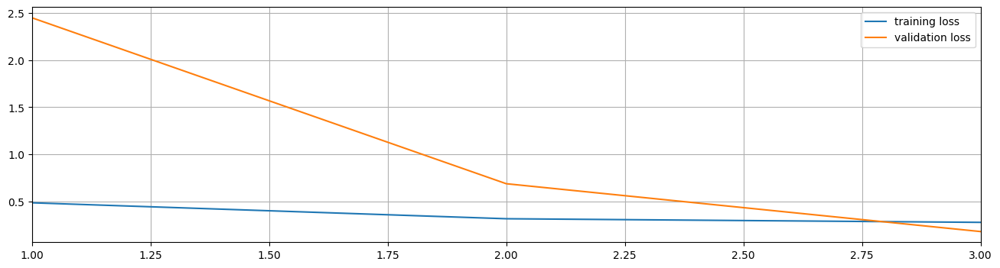

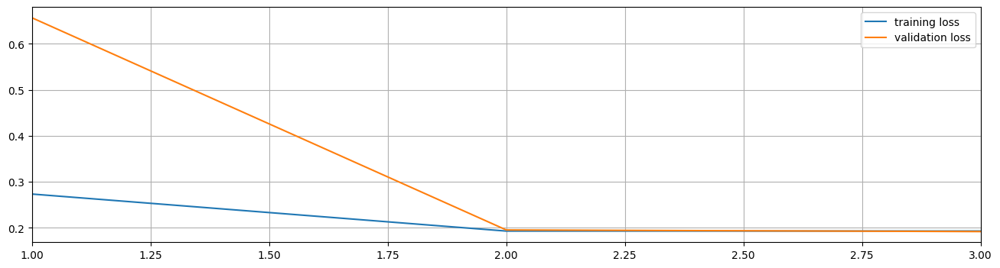

In [32]:
# Loading pre-trained ResNet50
md_full_geo = models.resnet50(pretrained=True)

# Final layer is modified for our use case
md_full_geo.fc = nn.Linear(2048, len(c2i) + 4)  # ResNet50 has 2048 features before final layer

# Sequential learning all the layers on clear images then foggy images
fit(md_full_geo.cuda(), tr_dl_clear, val_dl_clear, loss=myloss, epochs=3, wd=1e-3, lr=0.003)
fit(md_full_geo.cuda(), tr_dl_foggy, val_dl_foggy, loss=myloss, epochs=3, wd=1e-3, lr=0.003)

In [33]:
# Evaluate on clear images
print("Clear images")
evaluate(md_full_geo, val_dl_clear)

# Evaluate on foggy images
print("Foggy images")
evaluate(md_full_geo, val_dl_foggy)

Clear images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  100
Number of valid predictions:  100
Number of invalid predictions:  0
Average IoU: 0.6607127591967583
Execution time: 9.207659721374512 seconds
Foggy images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  100
Number of valid predictions:  100
Number of invalid predictions:  0
Average IoU: 0.6703252971172333
Execution time: 0.8927605152130127 seconds


####***Case 2: Color and Lighting Transformations***
This second case focuses in situations where color and lighting are varied. This aims to make the model more robust in varied illumination, and where there are under or overexposure.

In [34]:
# Defining the Color and Lighting Transformations
tfms = transforms.Compose([
    Brightness(),
    Contrast(),
    ResizeCrop(),
    ToTensor(),
    Normalize(mean=imagenet_stats[0], std=imagenet_stats[1])])

# Dataset definition
train_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_train_files, transforms=tfms)
train_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_train_files, transforms=tfms, data_type="foggy")

valid_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_valid_files, transforms=tfms)
valid_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_valid_files, transforms=tfms, data_type="foggy")

# Creating the data loaders
batch_size = 32

tr_dl_clear = DataLoader(train_clear_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
tr_dl_foggy = DataLoader(train_foggy_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

val_dl_clear = DataLoader(valid_clear_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
val_dl_foggy = DataLoader(valid_foggy_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.4396	validation loss: 1.3503	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.2730	validation loss: 0.2321	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.2687	validation loss: 0.1523	validation accuracy: 1.00


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.2795	validation loss: 0.2156	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.2093	validation loss: 0.9911	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.2023	validation loss: 0.6570	validation accuracy: 1.00


([np.float32(0.27949), np.float32(0.20934057), np.float32(0.20230286)],
 [np.float32(0.21564394), np.float32(0.9910943), np.float32(0.65695834)])

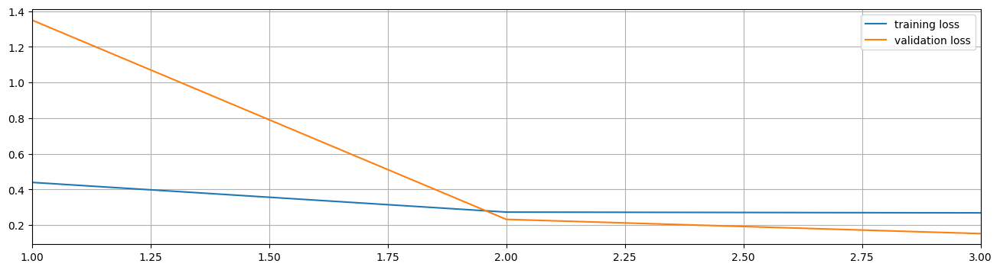

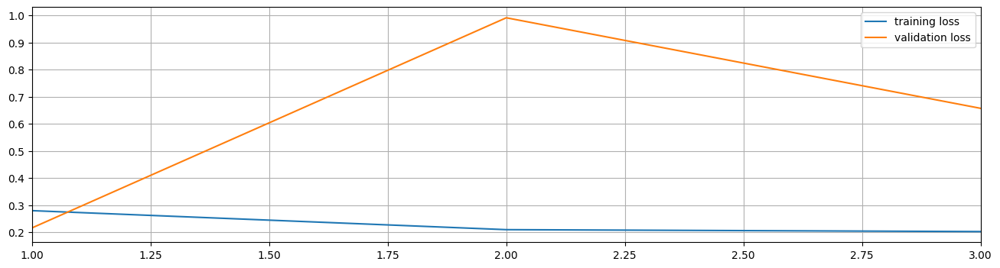

In [35]:
# Loading pre-trained ResNet50
md_full_cl = models.resnet50(pretrained=True)

# Final layer is modified for our use case
md_full_cl.fc = nn.Linear(2048, len(c2i) + 4)  # ResNet50 has 2048 features before the final layer

# Sequential learning all the layers on clear images then foggy images
fit(md_full_cl.cuda(), tr_dl_clear, val_dl_clear, loss=myloss, epochs=3, wd=1e-3, lr=0.003)
fit(md_full_cl.cuda(), tr_dl_foggy, val_dl_foggy, loss=myloss, epochs=3, wd=1e-3, lr=0.003)

In [36]:
# Evaluate on clear images
print("Clear images")
evaluate(md_full_cl, val_dl_clear)

# Evaluate on foggy images
print("Foggy images")
evaluate(md_full_cl, val_dl_foggy)

Clear images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  100
Number of valid predictions:  100
Number of invalid predictions:  0
Average IoU: 0.48095310255885126
Execution time: 21.37942671775818 seconds
Foggy images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  100
Number of valid predictions:  100
Number of invalid predictions:  0
Average IoU: 0.4549538557231426
Execution time: 1.021759271621704 seconds


####***Case 3: Blurring Transformation***

In [37]:
# Defining the Blurring Transformation
tfms = transforms.Compose([
    GaussianBlur(),
    ResizeCrop(),
    ToTensor(),
    Normalize(mean=imagenet_stats[0], std=imagenet_stats[1])])

# Dataset definition
train_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_train_files, transforms=tfms)
train_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_train_files, transforms=tfms, data_type="foggy")

valid_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_valid_files, transforms=tfms)
valid_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_valid_files, transforms=tfms, data_type="foggy")

# Creating the data loaders
batch_size = 32

tr_dl_clear = DataLoader(train_clear_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
tr_dl_foggy = DataLoader(train_foggy_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

val_dl_clear = DataLoader(valid_clear_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
val_dl_foggy = DataLoader(valid_foggy_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.4554	validation loss: 2.3455	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.3147	validation loss: 0.1547	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.2598	validation loss: 0.1722	validation accuracy: 1.00


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.2407	validation loss: 0.1910	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.2109	validation loss: 0.2356	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.1881	validation loss: 0.1869	validation accuracy: 1.00


([np.float32(0.24071048), np.float32(0.21092454), np.float32(0.18808776)],
 [np.float32(0.19097736), np.float32(0.23561996), np.float32(0.18686098)])

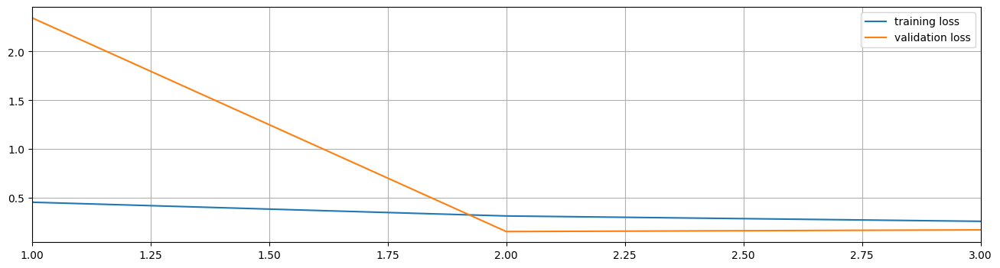

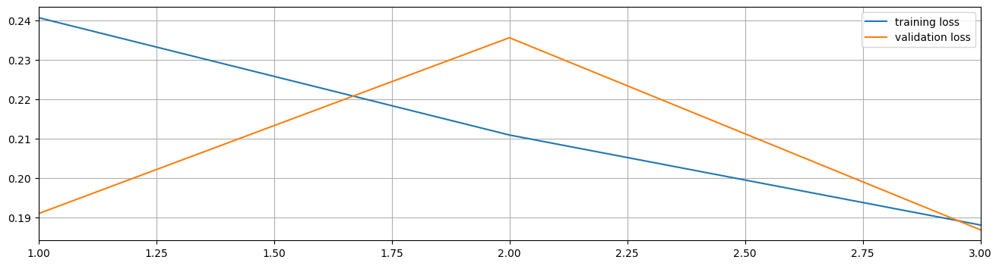

In [38]:
# Loading pre-trained ResNet50
md_full_blur = models.resnet50(pretrained=True)

# Final layer is modified for our use case
md_full_blur.fc = nn.Linear(2048, len(c2i) + 4)  # ResNet50 has 2048 features before the final layer

# Sequential learning all the layers on clear images then foggy images
fit(md_full_blur.cuda(), tr_dl_clear, val_dl_clear, loss=myloss, epochs=3, wd=1e-3, lr=0.003)
fit(md_full_blur.cuda(), tr_dl_foggy, val_dl_foggy, loss=myloss, epochs=3, wd=1e-3, lr=0.003)

In [39]:
# Evaluate on clear images
print("Clear images")
evaluate(md_full_blur, val_dl_clear)

# Evaluate on foggy images
print("Foggy images")
evaluate(md_full_blur, val_dl_foggy)

Clear images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  100
Number of valid predictions:  100
Number of invalid predictions:  0
Average IoU: 0.6574723926186562
Execution time: 25.93936800956726 seconds
Foggy images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  100
Number of valid predictions:  100
Number of invalid predictions:  0
Average IoU: 0.6878765735030175
Execution time: 1.0920131206512451 seconds


####***Case 4: Combined Transformation***

In [40]:
# Defining the combined Transformation
tfms = transforms.Compose([
    ResizeCrop(),
    FlipHoriz(),
    Brightness(),
    Contrast(),
    GaussianBlur(),
    ToTensor(),
    Normalize(mean=imagenet_stats[0], std=imagenet_stats[1])])

# Dataset definition
train_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_train_files, transforms=tfms)
train_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_train_files, transforms=tfms, data_type="foggy")

valid_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_valid_files, transforms=tfms)
valid_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_valid_files, transforms=tfms, data_type="foggy")

# Creating the data loaders
batch_size = 32

tr_dl_clear = DataLoader(train_clear_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
tr_dl_foggy = DataLoader(train_foggy_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

val_dl_clear = DataLoader(valid_clear_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
val_dl_foggy = DataLoader(valid_foggy_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.4620	validation loss: 2.4664	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.3202	validation loss: 0.4930	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.2946	validation loss: 0.2289	validation accuracy: 1.00


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.2544	validation loss: 0.1996	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.2071	validation loss: 0.1805	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.2042	validation loss: 0.2160	validation accuracy: 1.00


([np.float32(0.25439647), np.float32(0.20709985), np.float32(0.20417345)],
 [np.float32(0.19962253), np.float32(0.18048567), np.float32(0.21602598)])

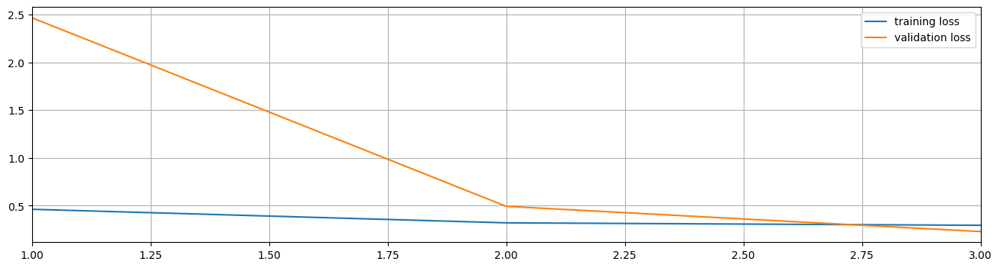

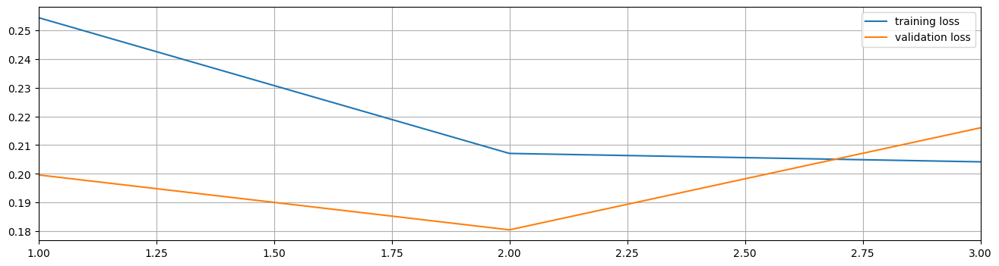

In [41]:
# Loading pre-trained ResNet50
md_full_all = models.resnet50(pretrained=True)

# Final layer is modified for our use case
md_full_all.fc = nn.Linear(2048, len(c2i) + 4)  # ResNet50 has 2048 features before the final layer

# Sequential learning all the layers on clear images then foggy images
fit(md_full_all.cuda(), tr_dl_clear, val_dl_clear, loss=myloss, epochs=3, wd=1e-3, lr=0.003)
fit(md_full_all.cuda(), tr_dl_foggy, val_dl_foggy, loss=myloss, epochs=3, wd=1e-3, lr=0.003)

In [42]:
# Evaluate on clear images
print("Clear images")
evaluate(md_full_all, val_dl_clear)

# Evaluate on foggy images
print("Foggy images")
evaluate(md_full_all, val_dl_foggy)

Clear images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  100
Number of valid predictions:  100
Number of invalid predictions:  0
Average IoU: 0.6656009787321091
Execution time: 9.398990392684937 seconds
Foggy images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  100
Number of valid predictions:  100
Number of invalid predictions:  0
Average IoU: 0.6753767129778862
Execution time: 1.0381190776824951 seconds


####***Hyperparameter Tuning***

This section systematically explores different combinations for the ResNet50's training parameters. The aim is to find a combination that produces the best performance. The following parameters values have been tested.

- `batch_size: [32, 64, 128]`

- `num_workers: [4, 8]`

- `learning_rate: [1e-5, 1e-4, 1e-3, 1e-2 , 0.003]`

- `weight_decay: [1e-4, 1e-3, 1e-2]`

- `epochs: [3 ,5, 7, 10]`

Tuning revealed that a batch size of 32, along with 4 worker processes, provided the best compromise between performance and computational resources. Increasing the batch size to 64 or 128 led to increased losses or CUDA out-of-memory errors, while raising the number of workers to 8 also resulted in memory issues. In terms of training time, 5 epochs was optimal, increasing to 10 epochs gave worsened average IoU. The effect of weight decay of 1e-4 reduced training and validation losses best compared to other values. These following combination of parameters gave a good compromise between model performance and computational efficiency:

`batch_size = 32, num_workers = 4, epochs = 5, wd= 1e-4, lr=1e-4`


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.2536	validation loss: 0.1402	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.0921	validation loss: 0.0462	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.0561	validation loss: 0.0365	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 3	training loss: 0.0589	validation loss: 0.0509	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 4	training loss: 0.0456	validation loss: 0.0233	validation accuracy: 1.00


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.1501	validation loss: 0.1508	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.1267	validation loss: 0.1568	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.1355	validation loss: 0.1538	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 3	training loss: 0.1319	validation loss: 0.1423	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 4	training loss: 0.1239	validation loss: 0.1311	validation accuracy: 1.00


([np.float32(0.15013252),
  np.float32(0.12674285),
  np.float32(0.13547522),
  np.float32(0.13193166),
  np.float32(0.1239243)],
 [np.float32(0.15079586),
  np.float32(0.15677068),
  np.float32(0.15384503),
  np.float32(0.14230122),
  np.float32(0.1310583)])

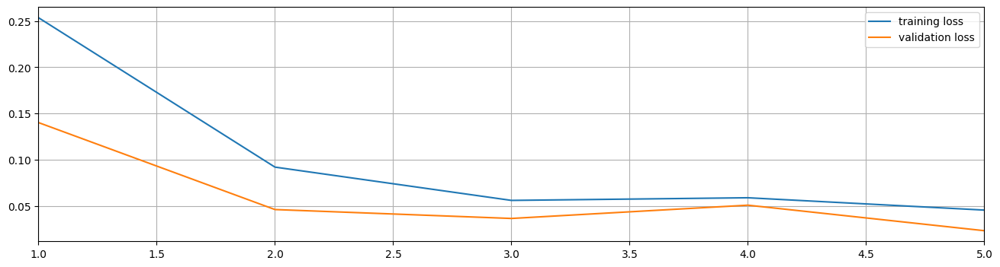

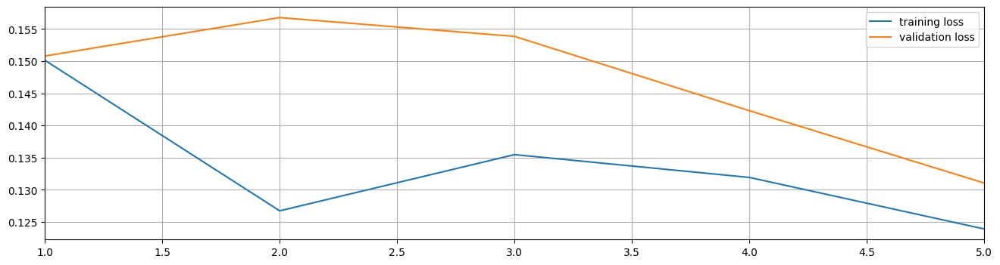

In [43]:
# Defining the combined Transformation
tfms = transforms.Compose([
    ResizeCrop(),
    FlipHoriz(),
    Brightness(),
    Contrast(),
    GaussianBlur(),
    ToTensor(),
    Normalize(mean=imagenet_stats[0], std=imagenet_stats[1])])

# Dataset definition
train_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_train_files, transforms=tfms)
train_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_train_files, transforms=tfms, data_type="foggy")

valid_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_valid_files, transforms=tfms)
valid_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_valid_files, transforms=tfms, data_type="foggy")

# HYPERPARAMETERS
batch_size = 32
num_workers = 4
epochs = 5
wd= 1e-4
lr=1e-4

# Creating the data loaders
tr_dl_clear = DataLoader(train_clear_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
tr_dl_foggy = DataLoader(train_foggy_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

val_dl_clear = DataLoader(valid_clear_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
val_dl_foggy = DataLoader(valid_foggy_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

# Loading pre-trained ResNet50
md_full_HPT = models.resnet50(pretrained=True)

# Final layer is modified for our use case
md_full_HPT.fc = nn.Linear(2048, len(c2i) + 4)  # ResNet50 has 2048 features before the final layer

# Sequential learning all the layers on clear images then foggy images
fit(md_full_HPT.cuda(), tr_dl_clear, val_dl_clear, loss=myloss, epochs=epochs, wd=wd, lr=lr)
fit(md_full_HPT.cuda(), tr_dl_foggy, val_dl_foggy, loss=myloss, epochs=epochs, wd=wd, lr=lr)

In [44]:
# Evaluate on clear images
print("Clear images")
evaluate(md_full_HPT, val_dl_clear)

# Evaluate on foggy images
print("Foggy images")
evaluate(md_full_HPT, val_dl_foggy)

Clear images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  100
Number of valid predictions:  100
Number of invalid predictions:  0
Average IoU: 0.7617824801802635
Execution time: 9.168216228485107 seconds
Foggy images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  100
Number of valid predictions:  100
Number of invalid predictions:  0
Average IoU: 0.7261052507162095
Execution time: 1.06834077835083 seconds


####**Freezing**

Freezing was implemented in the transfer learning to temporarily prevent weights of certain layers in the pre-trained Resnet50 from being updated during training. This technique was done for plate detection to preserve the general image features already learnt by the Resnet50, this allows the model to adapt to the new objective without disrupting its prior learning.

The implementation of freezing was performed in two steps. The pre-trained ResNet50 layers are frozen and trained only the new detection layer on clear images, then on foggy images separately. This allowed the model to learn specific nnumber plate features while retaining previous learning for other images. Then, all layers were unfrozen and further tuned the whole model on both clear and foggy images with a lower learning rate of 1e-5 which significant stabalised the decreasing training and validation losses.

In [45]:
# Defining the combined Transformation
tfms = transforms.Compose([
    ResizeCrop(),
    FlipHoriz(),
    Brightness(),
    Contrast(),
    GaussianBlur(),
    ToTensor(),
    Normalize(mean=imagenet_stats[0], std=imagenet_stats[1])])

# Dataset definition
train_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_train_files, transforms=tfms)
train_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_train_files, transforms=tfms, data_type="foggy")

valid_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_valid_files, transforms=tfms)
valid_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_valid_files, transforms=tfms, data_type="foggy")

# HYPERPARAMETERS
batch_size = 32
num_workers = 4
epochs = 4
wd= 1e-4
lr=1e-4
lower_lr=1e-5

# Creating the data loaders
tr_dl_clear = DataLoader(train_clear_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
tr_dl_foggy = DataLoader(train_foggy_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

val_dl_clear = DataLoader(valid_clear_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
val_dl_foggy = DataLoader(valid_foggy_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.3400	validation loss: 0.1750	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.2428	validation loss: 0.1593	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.2265	validation loss: 0.1433	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 3	training loss: 0.2175	validation loss: 0.1553	validation accuracy: 1.00


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.1974	validation loss: 0.1489	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.1745	validation loss: 0.1173	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.1400	validation loss: 0.0860	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 3	training loss: 0.1294	validation loss: 0.0792	validation accuracy: 1.00


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.1933	validation loss: 0.1955	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.1747	validation loss: 0.2092	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.1735	validation loss: 0.1531	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 3	training loss: 0.1651	validation loss: 0.1851	validation accuracy: 1.00


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.1560	validation loss: 0.1535	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.1543	validation loss: 0.1604	validation accuracy: 1.00


([np.float32(0.15597296), np.float32(0.15428378)],
 [np.float32(0.15347296), np.float32(0.16035047)])

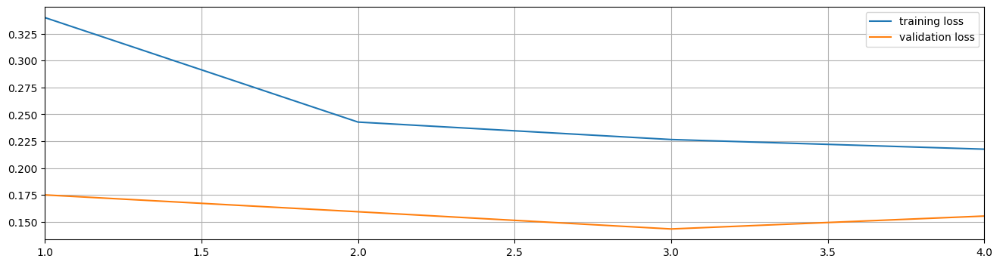

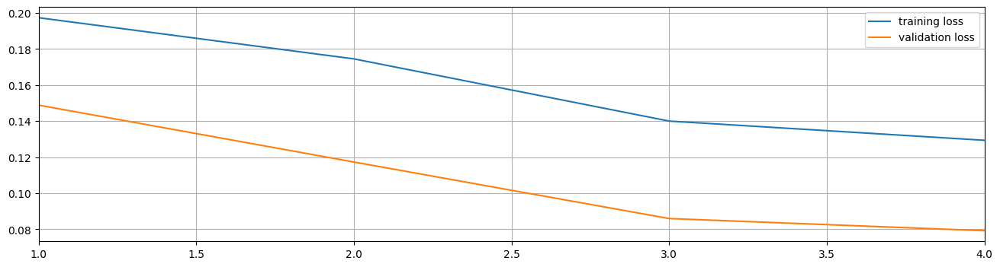

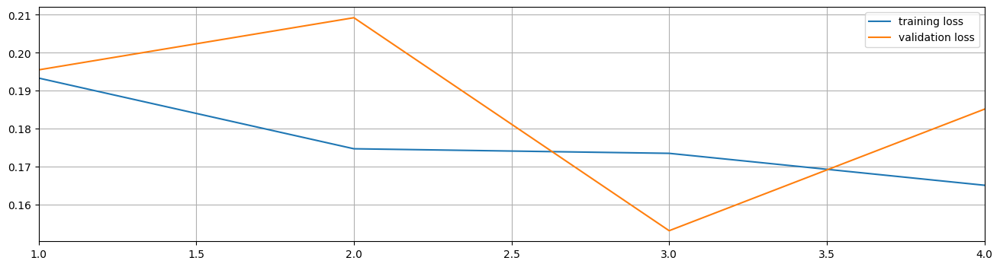

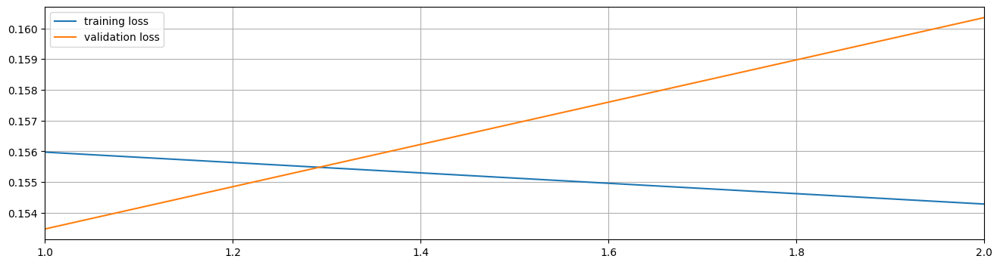

In [46]:
# Load a pre-trained ResNet50 model
md_frz = models.resnet50(pretrained=True)

# Modify the final fully connected layer for number plate detection
md_frz.fc = nn.Linear(2048, len(c2i) + 4)  # ResNet50 has 2048 features before the final layer

# Freeze all pre-trained layers
freeze_to(md_frz, -1)

# Train the model with frozen pre-trained layers
fit(md_frz.cuda(), tr_dl_clear, val_dl_clear, loss=myloss, epochs=epochs, wd=wd, lr=lr)

# Unfreeze all layers for fine-tuning
unfreeze_to(md_frz, -1)

# Fine-tune the entire model with a lower learning rate
fit(md_frz.cuda(), tr_dl_clear, val_dl_clear, loss=myloss, epochs=epochs, wd=wd, lr=lower_lr)

# Freeze all pre-trained layers
freeze_to(md_frz, -1)

# Train the model with frozen pre-trained layers on FOGGY dataset
fit(md_frz.cuda(), tr_dl_foggy, val_dl_foggy, loss=myloss, epochs=epochs, wd=wd, lr=lr)  # Adjust lr and epochs if needed

# Unfreeze all layers for fine-tuning on FOGGY dataset
unfreeze_to(md_frz, -1)

# Fine-tune the entire model with a lower learning rate on FOGGY dataset
fit(md_frz.cuda(), tr_dl_foggy, val_dl_foggy, loss=myloss, epochs=2, wd=wd, lr=lower_lr)  # Adjust lr and epochs if needed

In [47]:
# Evaluate on clear images
print("Clear images")
evaluate(md_full_HPT, val_dl_clear)

# Evaluate on foggy images
print("Foggy images")
evaluate(md_full_HPT, val_dl_foggy)

Clear images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  100
Number of valid predictions:  100
Number of invalid predictions:  0
Average IoU: 0.7635307988524437
Execution time: 9.362599611282349 seconds
Foggy images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  100
Number of valid predictions:  100
Number of invalid predictions:  0
Average IoU: 0.7216766491532326
Execution time: 1.0607452392578125 seconds


### **2.2.3 Evaluation**

####**Final Model Training**

The final model is a tuned, pre-trained ResNet50 adapted for number plate detection using transfer learning. It is trained sequentially on augmented clear and foggy image datasets. Freezing and hyperparameter-tuning techniques were implemented for optimisation of training and validation losses and IoU.

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.3194	validation loss: 0.2007	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.2402	validation loss: 0.1578	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.2263	validation loss: 0.1553	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 3	training loss: 0.2099	validation loss: 0.1436	validation accuracy: 1.00


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.1996	validation loss: 0.1373	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.1797	validation loss: 0.1353	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.1486	validation loss: 0.1044	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 3	training loss: 0.1230	validation loss: 0.0794	validation accuracy: 1.00


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.2002	validation loss: 0.1915	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.1863	validation loss: 0.1661	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 2	training loss: 0.1777	validation loss: 0.1716	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 3	training loss: 0.1697	validation loss: 0.1635	validation accuracy: 1.00


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 0	training loss: 0.1679	validation loss: 0.1847	validation accuracy: 1.00


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

epoch: 1	training loss: 0.1578	validation loss: 0.1740	validation accuracy: 1.00


([np.float32(0.1679246), np.float32(0.1577992)],
 [np.float32(0.18468627), np.float32(0.17397769)])

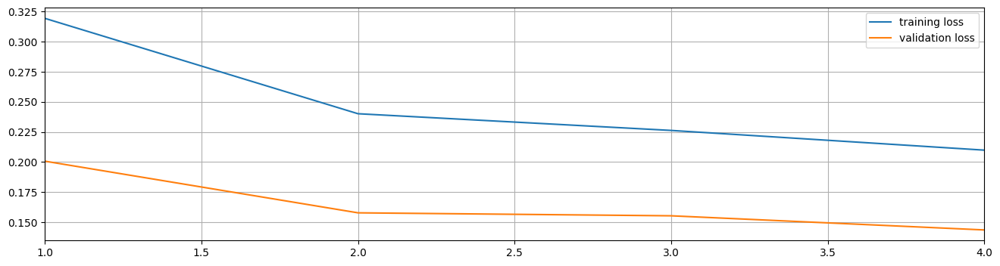

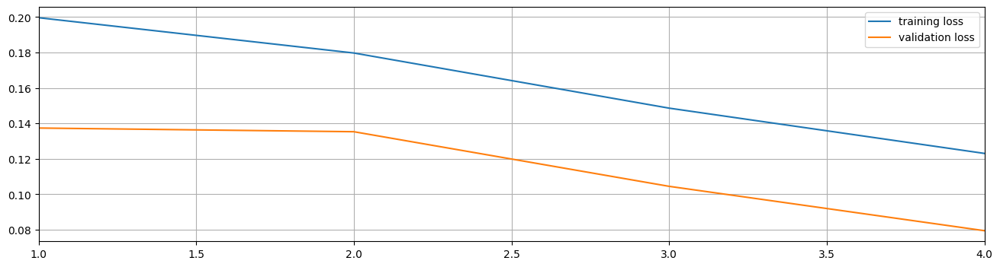

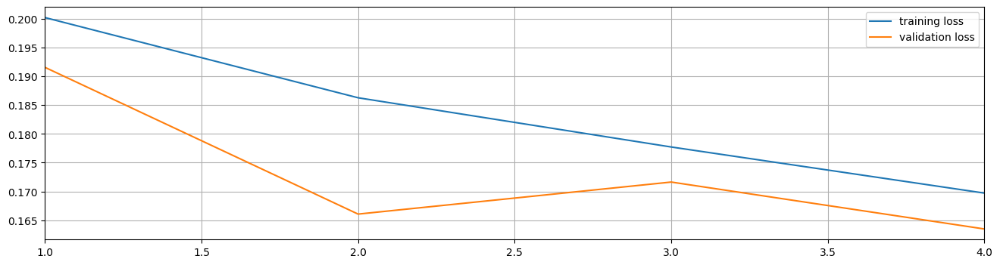

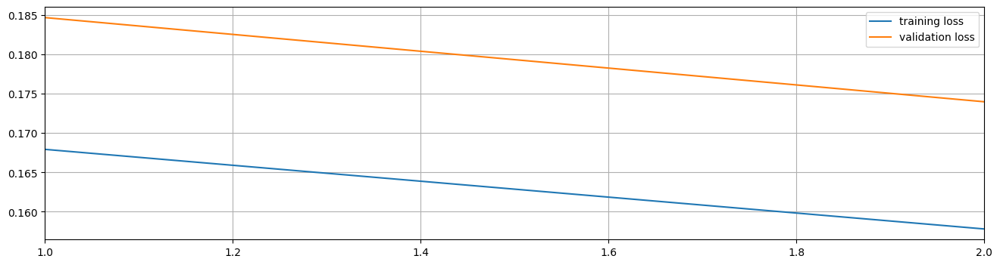

In [48]:
# Defining the combined Transformation
tfms = transforms.Compose([
    ResizeCrop(),
    FlipHoriz(),
    Brightness(),
    Contrast(),
    GaussianBlur(),
    ToTensor(),
    Normalize(mean=imagenet_stats[0], std=imagenet_stats[1])])

# Dataset definition
train_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_train_files, transforms=tfms)
train_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_train_files, transforms=tfms, data_type="foggy")

valid_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_valid_files, transforms=tfms)
valid_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_valid_files, transforms=tfms, data_type="foggy")

# HYPERPARAMETERS
batch_size = 32
num_workers = 4
epochs = 4
wd= 1e-4
lr=1e-4
lower_lr=1e-5

# Creating the data loaders
tr_dl_clear = DataLoader(train_clear_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
tr_dl_foggy = DataLoader(train_foggy_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

val_dl_clear = DataLoader(valid_clear_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
val_dl_foggy = DataLoader(valid_foggy_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

# Final model training with Freezing
final_model = models.resnet50(pretrained=True)
final_model.fc = nn.Linear(2048, len(c2i) + 4)

freeze_to(final_model, -1)
fit(final_model.cuda(), tr_dl_clear, val_dl_clear, loss=myloss, epochs=epochs, wd=wd, lr=lr)
unfreeze_to(final_model, -1)
fit(final_model.cuda(), tr_dl_clear, val_dl_clear, loss=myloss, epochs=epochs, wd=wd, lr=lower_lr)
freeze_to(final_model, -1)
fit(final_model.cuda(), tr_dl_foggy, val_dl_foggy, loss=myloss, epochs=epochs, wd=wd, lr=lr)
unfreeze_to(final_model, -1)
fit(final_model.cuda(), tr_dl_foggy, val_dl_foggy, loss=myloss, epochs=2, wd=wd, lr=lower_lr)

####**Evaluating on Test Sets**

The separate and untouched test datasets for clear and foggy images were used by the final trained model. This will allow us to correctly gauge its performance in real-world scenarios.

In [49]:
tfms_test = transforms.Compose([
    ResizeCrop(),
    ToTensor(),
    Normalize(mean=imagenet_stats[0], std=imagenet_stats[1])])

test_clear_dataset = NumberPlateDataset(image_dir='clear_images', annotation_file='annot_clear.json', image_names=clear_test_files, transforms=tfms_test)
test_foggy_dataset = NumberPlateDataset(image_dir='foggy_images', annotation_file='annot_foggy.json', image_names=foggy_test_files, transforms=tfms_test, data_type="foggy")

# Creating the data loaders
test_dl_clear = DataLoader(test_clear_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
test_dl_foggy = DataLoader(test_foggy_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

# Evaluate on clear images
print("Clear images")
evaluate(final_model, test_dl_clear)

# Evaluate on foggy images
print("Foggy images")
evaluate(final_model, test_dl_foggy)

Clear images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  101
Number of valid predictions:  101
Number of invalid predictions:  0
Average IoU: 0.6925516827861862
Execution time: 9.041619062423706 seconds
Foggy images


  0%|          | 0/4 [00:00<?, ?it/s]

Total number of predictions:  101
Number of valid predictions:  101
Number of invalid predictions:  0
Average IoU: 0.712971433259473
Execution time: 0.9752678871154785 seconds


####**Error Analysis**

Mistakes made by the model can be examined through error analysis. This involves analyzing the model's predictions such as the most incorrect and correct examples. This is useful because you can obtain insights into sspecific cases where the model struggles the most and potentially identify limitations of training data or features. It can help to provide a direction of where to start improving the model.

#####*Clear images*

The most incorrect and correct examples are provided when the final model is tested on the clear images test set.

  0%|          | 0/4 [00:00<?, ?it/s]

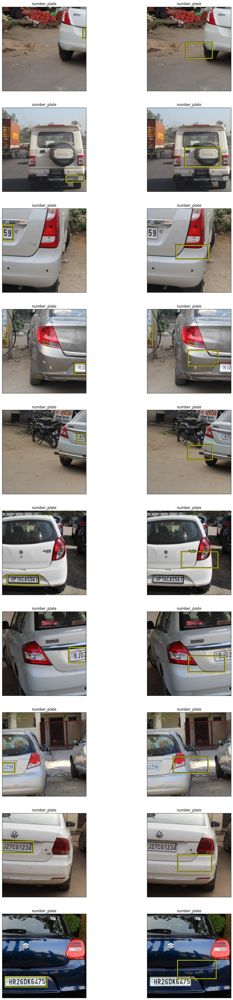

In [50]:
predictions, ground_truth, images = get_preds(final_model.cuda(), test_dl_clear, with_x=True)

tar_cls = tc.stack(list(chain(*[y[0] for y in ground_truth])))
tar_reg = tc.stack(list(chain(*[y[1] for y in ground_truth])))
ground_truth = [tar_cls, tar_reg]

# Most incorrect examples
losses = myloss(predictions, ground_truth, reduction='none')
_, ix = (-losses).sort()

cnt = 10
show_results(predictions[ix[:cnt]], [ground_truth[0][ix[:cnt]], ground_truth[1][ix[:cnt]]], images[ix[:cnt]])
plt.show()

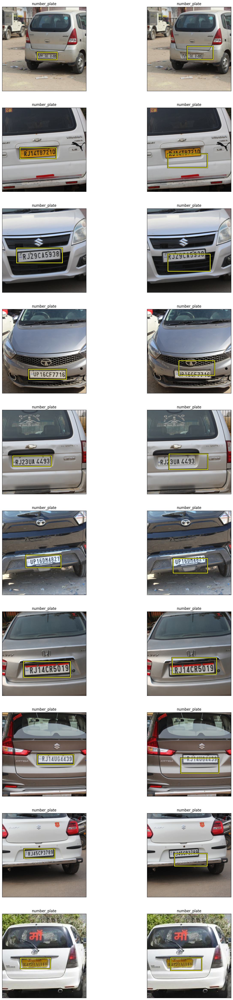

In [51]:
# most correct examples
cnt = 10
show_results(predictions[ix[-cnt:]], [ground_truth[0][ix[-cnt:]], ground_truth[1][ix[-cnt:]]], images[ix[-cnt:]])
plt.show()

#####*Foggy images*

The most incorrect and correct examples are provided when the final model is tested on the foggy images test set.

  0%|          | 0/4 [00:00<?, ?it/s]

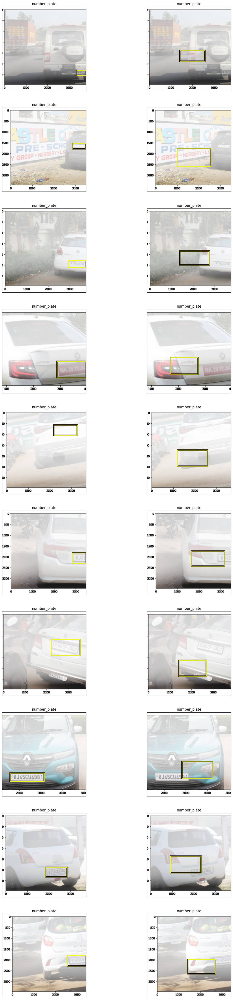

In [52]:
predictions, ground_truth, images = get_preds(final_model.cuda(), test_dl_foggy, with_x=True)

tar_cls = tc.stack(list(chain(*[y[0] for y in ground_truth])))
tar_reg = tc.stack(list(chain(*[y[1] for y in ground_truth])))
ground_truth = [tar_cls, tar_reg]

# Most incorrect examples
losses = myloss(predictions, ground_truth, reduction='none')
_, ix = (-losses).sort()

cnt = 10
show_results(predictions[ix[:cnt]], [ground_truth[0][ix[:cnt]], ground_truth[1][ix[:cnt]]], images[ix[:cnt]])
plt.show()

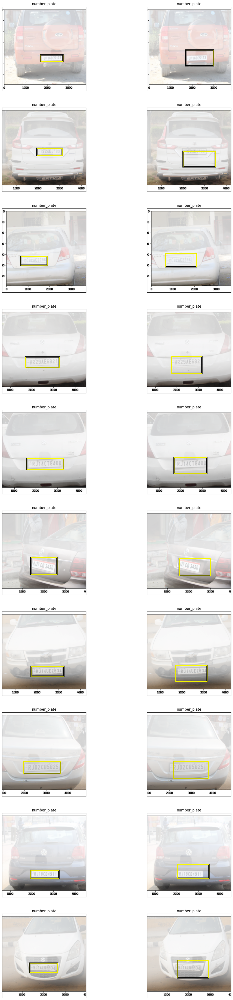

In [53]:
# most correct examples
cnt = 10
show_results(predictions[ix[-cnt:]], [ground_truth[0][ix[-cnt:]], ground_truth[1][ix[-cnt:]]], images[ix[-cnt:]])
plt.show()

#### **Discussion**


*Results*

The final model obtained a lower average Intersection over Union for clear images compared to foggy images. The average IoU for clear images was 0.67, whereas 0.72 for foggy images. This is a counterintuitive result- this may be because the model overfitted to common features in the augmented training clear images. While data augmentation provided more image variations, the model may have relied on specific patterns introduced by these augmentations, which would not be as common in the real-world clear test images. Furthermore, the model may have learned more generalised characteristics from foggy images. Another reason may be differences in image quality or the characteristics of the clear and foggy datasets used for training.

Moreover, the final model detected number plates in foggy images significantly faster than in clear images. Processing foggy images took only 1.05 seconds, whereas clear images took 10.47 seconds. This difference may be due to that foggy images have simpler and fewer distracting elements in the background. The fog's obscuring effect diminishes background details which may make it easier for the model to detect number plates and identify its bounding box quicker. On the other hand, clear images haves more visual clutter in the background which would make it harder for the model to locate and isolate the number plate, which will slow down processing time.

Moving on to discussing error analysis results, for the most correct examples, the model tends to produce bounding boxes that are slightly larger than the ground truth attempting to encompass the whole number plate with the bounding box. This is observed visually by comparing the predicted and ground truth bounding boxes in the displayed results; the predicted boxes are very generous in their coverage. This suggests that the model prioritizes minimizing false negatives, that is missing the number plate entirely, over achieving a perfect bounding box. By producing a larger bounding box, the model can ensure it captures the entire plate, even if it includes some background. The model's "safe" approach behaviour may be because it is penalised more for mising a number plate than for having a slightly inaccurate bounding box.

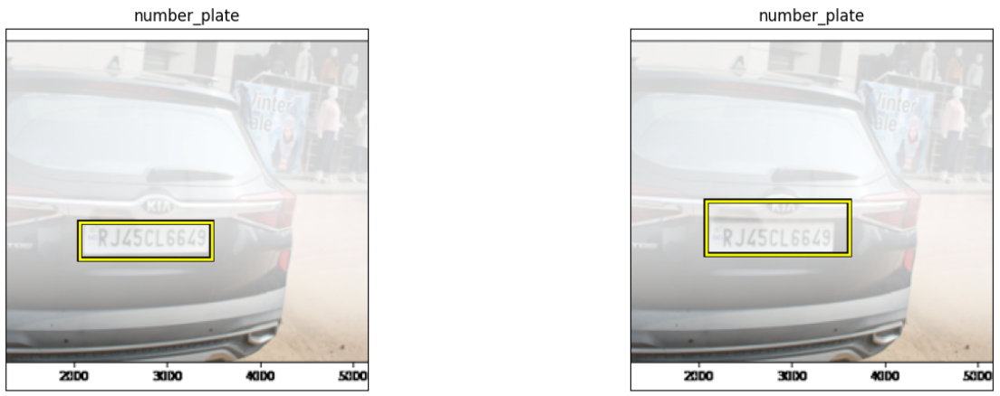

**Figure 2: The model's "safe" approach behaviour**

Another observation from the error analysis is that when the model struggles to locate a number plate, it tends to predict a bounding box centered in the middle of the image. The displayed results for most incorrect examples show that the predicted bounding boxes are often clustered around the center, even there is no number plate is present there. This suggests that there is a bias in the model's predictions when it is lacking confidence. When the trained model is unable to locate clear features of number plates, its fall back on a default strategy of placing the bounding box in the center. This bias could be because of the distribution of number plates in the training images, where they may be more frequently located towards the center of the image. The data augmentation ResizeCrop() appears to have not been sufficient to prevent this.

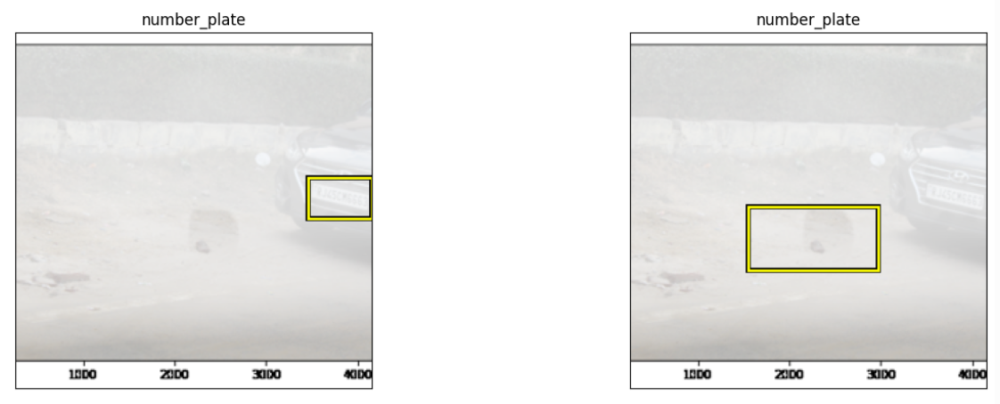

**Figure 3: Model tends to predict a bounding box centered in the middle of the image**

*Reflection*

This section has accomplished its key objectives. It effectively gathered and preprocessed clear and foggy image datasets. ResNet50 model has been trained, and its performance was improved through freezing and hyperparameter tuning. Using average IoU on a held-out test set provided a good measure to observe how good our model was.

Things that went well include data augmentation which broadened the model's learning scope. Transfer learning of a pre-trained ResNet50 accelerated training and improved feature extraction. The implementation of freezing stabilised the model and hyperparameter-tuning optimised its performance. The metric average IoU provided a robust evaluation metric for bounding box accuracy.

What did not go well was the model unexpectedly performed worse on clear images possibly due to overfitting or dataset limitations. The tendency to predict bounding boxes in the centre of the image in challenging cases indicated potential bias. Moreover, computational costs and time have restricted further experimentation due to the time restriction of the project. However, future research directions is provided in the next section to discuss where to go next with this project.

#### **Future Research Direction**

To address the model's "safe" predictions and overly large bounding boxes, future reserach direction should include tuning the loss function to better balance false negatives and localization errors. Furthermore, implementing data augmentations like tighter random cropping which would improve localisation of number plates. Another could be implementing a quantisised artificial fog where the amount of fog could be controlled by the experimenter.

In order to reduce the model's tendency to default to centered predictions, future research should include explicitly training the model on more challenging examples such as images where there are no number plates or those with number plates not in the centre of the image. This will allow the model to learn to avoid guessing in wrong places. Moreover, contextual information could be implemented such as using vehicle shape to aid the model where number plates could be located. Another way is to provide more dataset diversity with number plates in varied positions; this will allow the model to learn more complex features. Also, using multi-stage detection could be used. This means using a simpler model to find likely regions where a plate may be located and then using a second model to tune the exact bounding box. This approach could help reduce reliance on center-positioned prediction of the bounding box.



### **Appendix A: Software and Environment Details**



In [54]:
import sklearn
import pandas
import numpy
import torch
import torchvision
import cv2 #OpenCV

print(f"scikit-learn: {sklearn.__version__}")
print(f"Pandas: {pandas.__version__}")
print(f"NumPy: {numpy.__version__}")
print(f"PyTorch: {torch.__version__}")
print(f"Torchvision: {torchvision.__version__}")
print(f"OpenCV: {cv2.__version__}")

import sys
print(f"Python: {sys.version}")

import google.colab
f"Colab: {google.colab.__version__}"

scikit-learn: 1.6.1
Pandas: 2.2.2
NumPy: 2.0.2
PyTorch: 2.6.0+cu124
Torchvision: 0.21.0+cu124
OpenCV: 4.11.0
Python: 3.11.12 (main, Apr  9 2025, 08:55:54) [GCC 11.4.0]


'Colab: 0.0.1a2'

---
# **3.Character Segmentation**

Import the needed libraries

In [55]:
!pip install natsort
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from natsort import natsorted


In [56]:
def preprocess_plate(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Histogram Equalization
    gray = cv2.equalizeHist(gray)

    # Strong CLAHE
    clahe = cv2.createCLAHE(clipLimit=6.0, tileGridSize=(8, 8))
    gray = clahe.apply(gray)

    # Fixed Threshold
    _, binary = cv2.threshold(gray, 80, 255, cv2.THRESH_BINARY_INV)
    return binary

Loop through all clear and foggy plates, perform character segmentation for both the clear and foggy images, save them, and create debug overlays.

In [57]:
import os
import json
import cv2

modes = ['clear', 'foggy']
annots = {'clear': 'annot_clear.json', 'foggy': 'annot_foggy.json'}
img_dirs = {
    'clear': 'data/ground_truth/Ground Truth images',
    'foggy': 'data/foggy/New Hazy dataset'
}

for mode in modes:
    print(f"\nCropping plates for {mode.upper()}...")
    image_dir = img_dirs[mode]
    plate_crop_dir = f'output_plates/{mode}'
    os.makedirs(plate_crop_dir, exist_ok=True)

    with open(annots[mode], 'r') as f:
        annotations = json.load(f)

    metadata = annotations.get('_via_img_metadata', annotations)  # Support both styles

    for key, data in metadata.items():
        filename = data.get('filename')
        if not filename:
            print(f"Skipping key {key} – no filename.")
            continue
        image_path = os.path.join(image_dir, filename)
        if not os.path.exists(image_path):
            print(f"Skipping {filename} – not found.")
            continue

        img = cv2.imread(image_path)
        for idx, region in enumerate(data.get('regions', [])):
            shape = region['shape_attributes']
            x, y, w, h = shape['x'], shape['y'], shape['width'], shape['height']
            cropped = img[y:y+h, x:x+w]
            crop_name = f"{os.path.splitext(filename)[0]}_crop{idx}.png"
            cv2.imwrite(os.path.join(plate_crop_dir, crop_name), cropped)

print("\n Plate cropping completed for both sets.")


Cropping plates for CLEAR...

Cropping plates for FOGGY...

 Plate cropping completed for both sets.


In [58]:
modes = ['clear', 'foggy']

for mode in modes:
    print(f"\n=== Processing {mode.upper()} plates ===")
    plate_crop_dir = f'output_plates/{mode}'
    char_output_dir = f'output_characters/{mode}'
    debug_output_dir = f'debug_boxes/{mode}'

    os.makedirs(char_output_dir, exist_ok=True)
    os.makedirs(debug_output_dir, exist_ok=True)

    for file in os.listdir(plate_crop_dir):
        if file.endswith('.png'):
            img_path = os.path.join(plate_crop_dir, file)
            img = cv2.imread(img_path)
            binary = preprocess_plate(img)

            # Morphological cleanup
            kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
            binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

            contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            plate_h, plate_w = binary.shape[:2]
            boxes = []

            for cnt in contours:
                x, y, w, h = cv2.boundingRect(cnt)
                rel_w = w / plate_w
                rel_h = h / plate_h
                aspect_ratio = w / float(h)

                if (
                    0.015 < rel_w < 0.35 and
                    0.25 < rel_h < 1.0 and
                    0.2 < aspect_ratio < 1.2 and
                    x > 1 and y > 1 and
                    x + w < plate_w - 1 and
                    y + h < plate_h - 1
                ):
                    boxes.append((x, y, w, h))

            if len(boxes) < 4:
                print(f"[WARN] Skipping {file}: only {len(boxes)} characters detected.")
                continue

            # Sort left to right
            boxes = sorted(boxes, key=lambda b: b[0])
            base_name = os.path.splitext(file)[0]

            for i, (x, y, w, h) in enumerate(boxes):
                char_img = binary[y:y+h, x:x+w]
                char_img = cv2.copyMakeBorder(char_img, 4, 4, 4, 4, cv2.BORDER_CONSTANT, value=0)
                char_img = cv2.resize(char_img, (28, 28))
                save_path = os.path.join(char_output_dir, f"{base_name}_char{i}.png")
                cv2.imwrite(save_path, char_img)

            # Save debug overlay
            debug_img = img.copy()
            for (x, y, w, h) in boxes:
                cv2.rectangle(debug_img, (x, y), (x + w, y + h), (0, 255, 0), 2)
            cv2.imwrite(os.path.join(debug_output_dir, f"{base_name}_boxes.png"), debug_img)

print("\nCharacter segmentation completed for both clear and foggy plates.")



=== Processing CLEAR plates ===
[WARN] Skipping 275_crop0.png: only 0 characters detected.
[WARN] Skipping 346_crop0.png: only 0 characters detected.
[WARN] Skipping 428_crop0.png: only 0 characters detected.
[WARN] Skipping 317_crop0.png: only 0 characters detected.
[WARN] Skipping 911_crop0.png: only 0 characters detected.
[WARN] Skipping 323_crop0.png: only 0 characters detected.
[WARN] Skipping 50_crop0.png: only 0 characters detected.
[WARN] Skipping 145_crop0.png: only 0 characters detected.
[WARN] Skipping 194_crop0.png: only 0 characters detected.
[WARN] Skipping 70_crop0.png: only 0 characters detected.
[WARN] Skipping 189_crop0.png: only 0 characters detected.
[WARN] Skipping 914_crop0.png: only 0 characters detected.
[WARN] Skipping 35_crop0.png: only 0 characters detected.
[WARN] Skipping 353_crop0.png: only 0 characters detected.
[WARN] Skipping 256_crop0.png: only 0 characters detected.
[WARN] Skipping 710_crop0.png: only 0 characters detected.
[WARN] Skipping 489_crop0.

Creating a function to visualise the characters

In [59]:
def visualize_characters(plate_id, mode='clear'):
    char_folder = f'output_characters/{mode}'
    char_images = [f for f in os.listdir(char_folder) if f.startswith(plate_id) and f.endswith('.png')]
    char_images = natsorted(char_images)

    if not char_images:
        print(f"No characters found for plate ID: {plate_id} in mode: {mode}")
        return

    plt.figure(figsize=(len(char_images)*2, 3))
    for i, fname in enumerate(char_images):
        img_path = os.path.join(char_folder, fname)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        plt.subplot(1, len(char_images), i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"char{i}", fontsize=8)
        plt.axis('off')
    plt.tight_layout()
    plt.show()


Creating a function to visualise the debug overlay on the plate itself

In [60]:
def visualize_debug_overlay(plate_id, mode='clear'):
    debug_path = f'debug_boxes/{mode}/{plate_id}_boxes.png'
    if not os.path.exists(debug_path):
        print(f"No debug overlay found for: {plate_id} in mode: {mode}")
        return

    img = cv2.imread(debug_path)
    plt.figure(figsize=(6, 3))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"{plate_id} Bounding Boxes ({mode})")
    plt.axis('off')
    plt.show()

Plotting

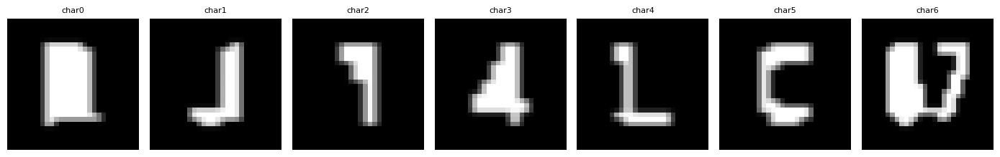

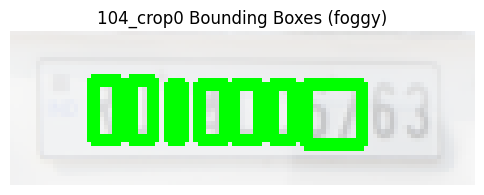

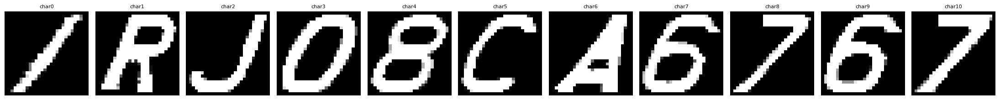

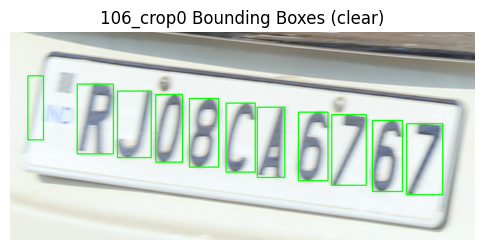

In [61]:
visualize_characters('104_crop0', mode='foggy')
visualize_debug_overlay('104_crop0', mode='foggy')

visualize_characters('106_crop0', mode='clear')
visualize_debug_overlay('106_crop0', mode='clear')

---
# **4.Character Recognition**

***Import a pretrained model from a GIthub Repository published at [srijan14/keras-handwritten-character-recognition](https://github.com/srijan14/keras-handwritten-character-recognition). This model has been trained on the EMNIST dataset.***

***EMNIST is an extended version of the MINST dataset that is designed to extend the original MINST dataset.***

**Cloning the Github Repo**

In [62]:
!git clone https://github.com/srijan14/keras-handwritten-character-recognition.git
%cd keras-handwritten-character-recognition/models

Cloning into 'keras-handwritten-character-recognition'...
remote: Enumerating objects: 216, done.
remote: Counting objects: 100% (49/49), done.
remote: Compressing objects: 100% (41/41), done.
remote: Total 216 (delta 34), reused 8 (delta 8), pack-reused 167 (from 1)
Receiving objects: 100% (216/216), 37.70 MiB | 16.37 MiB/s, done.
Resolving deltas: 100% (119/119), done.
/content/keras-handwritten-character-recognition/models


**Loading the pretrained CNN model**



In [63]:
from tensorflow.keras.models import load_model

# Loading the pretrained CNN model
model = load_model('model.h5')

# Mapping digits and Alphabets according to EMnist class
Mapp_classes = '0123456789ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz'

# Function to detect a single charecter from a grey scale 28x28 image
def predict_character(img):
    img = img.astype("float32") / 255.0 # normalizing pixel value between 0 and 1

    # model takes inout in 4D, converting image into 4D
    img = np.expand_dims(img, axis=-1)
    img = np.expand_dims(img, axis=0)

    prediction = model.predict(img) # Checking prediction score against each class
    prediction_index = np.argmax(prediction) # getting the index of the class with the most score

    # Error handling if there if a mismatch of index
    if prediction_index >= len(Mapp_classes):
        print("[ERROR] Prediction index ", prediction_index , " out of range for class mapping.")
        return '?'

    return Mapp_classes[prediction_index]

***We will ignore the optimzer warning(Matters for retraining, not predicting) and the metrics warning (Used for model evaluation which we are not doing right now, we will only be using the model to predict)***

**Forming a function to see recognize plate charecters**

In [64]:
def recognize_plate_characters(plate_id, mode='clear'):

    # Getting charecter images from the folder
    char_image_folder = f'/content/output_characters/{mode}'

    char_images = []
    for f in os.listdir(char_image_folder):
        if f.startswith(plate_id) and f.endswith('.png'):
            char_images.append(f)

    # Maintaining left to right order of images which is important for plate recognition.
    char_images = natsorted(char_images)

    # Error handling if no images found.
    if not char_images:
        print("[ERROR] No characters found for plate ID: : ",plate_id, " in mode: ", mode)
        return

    predicted_text = ''
    num_chars = len(char_images)
    plt.figure(figsize=(num_chars * 2, 3))

    # Looping through all character images and skipping it if image doesn't load. Sending the image to predict_character
    for i, fname in enumerate(char_images):
        img_path = os.path.join(char_image_folder, fname)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        # Error handling
        if img is None:
            print(f"[WARNING] Couldn't load image: {img_path}")
            continue

        char = predict_character(img)
        predicted_text += char

        # Displaying image
        plt.subplot(1, num_chars, i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"'{char}'", fontsize=12)
        plt.axis('off')

    plt.suptitle(f"Plate ID: {plate_id} | Recognized: {predicted_text}", fontsize=14)
    plt.tight_layout()
    plt.show()
    print("--------------------------------------")
    print(f"[RESULT] Recognized Plate ({mode.upper()}): {predicted_text}")
    print("--------------------------------------")
    return predicted_text

**Detect charecters in the image**

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 823ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


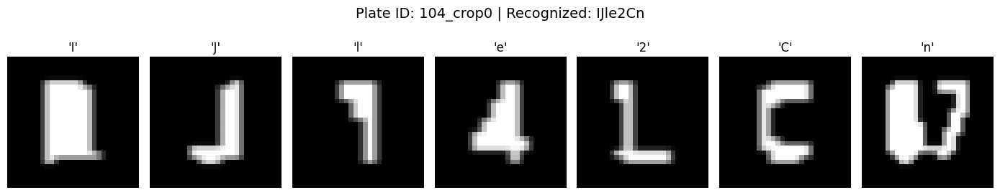

--------------------------------------
[RESULT] Recognized Plate (FOGGY): IJle2Cn
--------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


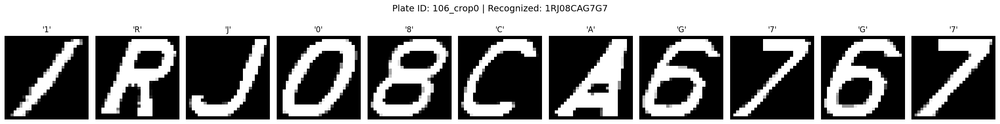

--------------------------------------
[RESULT] Recognized Plate (CLEAR): 1RJ08CAG7G7
--------------------------------------


In [65]:
# Foggy plate character recognition
_ = recognize_plate_characters('104_crop0', mode='foggy')

# Clear plate character recognition
_ = recognize_plate_characters('106_crop0', mode='clear')

#**References**


Bansal, G., Joshi, L., Gupta, M. and Dahiya, P., 2024. Automatic Number Plate Recognition in Hazy Conditions. 2024 First International Conference on Electronics, Communication and Signal Processing (ICECSP), 1–5. Available from: https://ieeexplore.ieee.org/document/10698015 [Accessed 6 March 2025].


Dutta, A., Gupta, A. and Zisserman, A., 2025. VGG Image Annotator (VIA). Visual Geometry Group, University of Oxford. Available from: https://www.robots.ox.ac.uk/~vgg/software/via/  [Accessed 14 May 2025]


OpenCV, 2025. Cascade Classifier. Open Source Computer Vision. Available from: https://docs.opencv.org/3.4/db/d28/tutorial_cascade_classifier.html [Accessed 14 May 2025]


Potrimba, P., 2024. What is ResNet-50? Roboflow. Available from: https://blog.roboflow.com/what-is-resnet-50/  [Accessed 14 May 2025]


Sharma, D., Sharma, S. and Bhatnagar, V., 2023. Foggy-Hazy License Plates Images. Mendeley Data,1. Available from: https://data.mendeley.com/datasets/p3jr4555tf/1  [Accessed 6 March 2025]


Tote, A. S., Pardeshi, S. S. and Patange, A. D., 2023. Automatic number plate detection using TensorFlow in Indian scenario: An optical character recognition approach. Materials Today: Proceedings, 72, 1073–1078. Available from: https://www.sciencedirect.com/science/article/pii/S2214785322059776 [Accessed 6 March 2025]


Vajpayee, S., 2020. AI Indian License Plate Recognition Data. Kaggle. Available from: https://www.kaggle.com/datasets/sarthakvajpayee/ai-indian-license-plate-recognition-data?select=indian_license_plate.xml  [Accessed 14 May 2025]


Vajpayee, S., 2021. License plate recognition using CNN. Kaggle. Available from: https://www.kaggle.com/code/sarthakvajpayee/license-plate-recognition-using-cnn/notebook [Accessed 14 May 2025]


Varma P, R. K., Ganta, S., B, H. K. and Svsrk, P., 2020. A Novel Method for Indian Vehicle Registration Number Plate Detection and Recognition using Image Processing Techniques. Procedia Computer Science, 167, 2623–2633. Available from: https://www.sciencedirect.com/science/article/pii/S1877050920307900 [Accessed 6 March 2025]


